In [3]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

In [4]:
class BlockingTimeSeriesSplit():
    def __init__(self, n_splits):
        self.n_splits = n_splits
    
    def get_n_splits(self, groups):
        return self.n_splits
    
    def split(self, X, y=None, groups=None):
        n_samples = len(X)
        k_fold_size = n_samples // self.n_splits
        indices = np.arange(n_samples)

        margin = 0
        for i in range(self.n_splits):
            start = i * k_fold_size
            stop = start + k_fold_size
            mid = int(0.8 * (stop - start)) + start
            yield indices[start: mid], indices[mid + margin: stop]

In [5]:
class minmax():
    def __init__(self):
        pass
        
    def minmax_transform_fit(self, train_df, valid_df):

        scaler = MinMaxScaler()
        scaler = scaler.fit(train_df)

        train_scaled = scaler.transform(train_df)
        train_scaled = pd.DataFrame(train_scaled)

        valid_scaled = scaler.transform(valid_df)
        valid_scaled = pd.DataFrame(valid_scaled)

        return scaler, train_scaled, valid_scaled
    
    def minmax_transform(self, scaler, test_df):
        
        test_scaled = scaler.transform(test_df)
        test_scaled = pd.DataFrame(test_scaled)

        return test_scaled
    
    def inverse_minmax(self, scaler, df):
        return scaler.inverse_transform(df)

In [6]:
class myPCA():
    def __init__(self):
        pass

    def PCA_transform_fit(self, train_df, valid_df):
        n = len(train_df.columns)
        self.pca = PCA(n_components = n)
        pca_train = self.pca.fit_transform(train_df)
        self.pca_train_df = pd.DataFrame(pca_train, columns = [f"pca{num + 1}" for num in range(n)])

        eig = self.pca.explained_variance_
        ratio = self.pca.explained_variance_ratio_
        acc_ratio = ratio.cumsum()

        self.pca_info = pd.DataFrame({
            "eig for variance": eig,
            "acc. explained": acc_ratio},
            index = np.array([f"pca{num + 1}" for num in range(n)])
        )

        pca_valid = self.pca.transform(valid_df)
        self.pca_valid_df = pd.DataFrame(pca_valid, columns = [f"pca{num + 1}" for num in range(n)])

        return self.pca_train_df, self.pca_valid_df
    
    def PCA_transform(self, test_df):
        
        n = len(test_df.columns)
        pca_test = self.pca.transform(test_df)
        self.pca_test_df = pd.DataFrame(pca_test, columns = [f"pca{num + 1}" for num in range(n)])
        
        return self.pca_test_df

# eigenvalue for variance >= 0.70
# accumulated ratio of variance explained >= 0.80

    def set_params(self):
        for i in range(len(self.pca_train_df.columns)):
            if (self.pca_info["acc. explained"][i] >= 0.80):
                self.param = i+1
                return self.param
        return len(self.pca_train_df.columns)-1    

In [7]:
class Preprocessing_minmax:
    
    matching_dict = {"1018640" : ["402", "403", "413"], "1018662": ["403", "413", "421"], "1018680": ["415", "510", "889"], "1018683": ["415", "510", "889"]}
    
    def __init__(self, code): #my_type: 0 (new fitting ... cv_num = 7, need to split test and train set) 1 (final fitting ... cv_num = 1, don't need to split test and train set)
        # code: water level region code
        # comp: component made by mstl
        self.code = code
        #self.my_type = my_type
        # if my_type == 0:
        #     self.num = 8 # blocking_cv num ... considering test set, set cv_num 8.
        # elif my_type == 1:
        #     self.num = 1
        
    def merging(self):
        
        self.loc_code = self.matching_dict[self.code]
        
        resid_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_resid.csv")
        #se24_lvl = pd.read_csv(f"./data_MSTL/MSTL3_lvl_{self.code}_se24.csv")
        #se360_lvl = pd.read_csv(f"./data_MSTL/MSTL3_lvl_{self.code}_se360.csv")
        se8760_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_se8760.csv")
        trend_lvl = pd.read_csv(f"./data_MSTL/MSTLtest_lvl_{self.code}_trend.csv")
        
        resid_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_resid.csv")
        #se24_fir = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[0]}_se24.csv")
        #se360_fir = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[0]}_se360.csv")
        se8760_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_se8760.csv")
        trend_fir = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[0]}_trend.csv")
        
        resid_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_resid.csv")
        #se24_sec = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[1]}_se24.csv")
        #se360_sec = pd.read_csv(f"./data_MSTL/MSTL_climate_{self.loc_code[1]}_se360.csv")
        se8760_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_se8760.csv")
        trend_sec = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[1]}_trend.csv")
        
        resid_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_resid.csv")
        #se24_thr = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[2]}_se24.csv")
        #se360_thr = pd.read_csv(f"./data_MSTL/MSTL3_climate_{self.loc_code[2]}_se360.csv")
        se8760_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_se8760.csv")
        trend_thr = pd.read_csv(f"./data_MSTL/MSTLtest_climate_{self.loc_code[2]}_trend.csv")
        
        resid_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        #se24_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_lvl.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_fir.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_sec.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        # se24_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        #se360_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        se8760_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        trend_thr.drop("Unnamed: 0", inplace = True, axis = 1)
        
        resid_lvl.columns = ["lvl_re"]
        # se24_lvl.columns = ["lvl_se24"]
        #se360_lvl.columns = ["lvl_se360"]
        se8760_lvl.columns = ["lvl_se8760"]
        trend_lvl.columns = ["lvl_tr"]
        
        #print(resid_fir)
        print(self.loc_code[0])
        
        resid_fir.columns = ["fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor"]
        # se24_fir.columns = ["fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor"]
        #se360_fir.columns = ["fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor"]
        se8760_fir.columns = ["fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor"]
        trend_fir.columns = ["fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor"]
        
        resid_sec.columns = ["sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor"]
        # se24_sec.columns = ["sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor"]
        #se360_sec.columns = ["sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor"]
        se8760_sec.columns = ["sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor"]
        trend_sec.columns = ["sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor"]
        
        resid_thr.columns = ["thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"]
        # se24_thr.columns = ["thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"]
        #se360_thr.columns = ["thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"]
        se8760_thr.columns = ["thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"]
        trend_thr.columns = ["thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"]
        
        
        # self.merged_df = pd.concat([resid_lvl, se24_lvl, se360_lvl, se8760_lvl, trend_lvl,
        #                            resid_fir, se24_fir, se360_fir, se8760_fir, trend_fir,
        #                            resid_sec, se24_sec, se360_sec, se8760_sec, trend_sec,
        #                            resid_thr, se24_thr, se360_thr, se8760_thr, trend_thr], axis = 1)
            
        self.merged_df = pd.concat([resid_lvl, se8760_lvl, trend_lvl,
                                   resid_fir, se8760_fir, trend_fir,
                                   resid_sec, se8760_sec, trend_sec,
                                   resid_thr, se8760_thr, trend_thr], axis = 1)
        
        self.merged_df = self.merged_df.dropna()

        #merged_df.head(30)
        
    def make_ind_set(self, num):
        blocking_instance = BlockingTimeSeriesSplit(n_splits = num)
        split_data = blocking_instance.split(self.merged_df)
        ind_set = []
        for i in range(num):
            ind_set += next(split_data)
        return ind_set
        
    def do_blocking(self):
        (self.full_data, self.full_data_test) = self.blocking(8)
        (self.full_data_final_test, _) = self.blocking(1)
        
    def do_minmax_and_pca(self):
        self.minmax_and_pca(8)
        
    def blocking(self, num):
        
        ind_set = self.make_ind_set(num)
        
        # trend = []; seasonal_24 = []; seasonal_360 = []; seasonal_8760 = []; residual = []
        trend = []; seasonal_8760 = []; residual = []
        trend_test = []; seasonal_8760_test = []; residual_test = []

        for i, ind in enumerate(ind_set):
            if i%2 == 0:
                train_df = self.merged_df.loc[ind]
                train_df.reset_index()
                # x_train = train_df.drop(['lvl_tr', 'lvl_se24', 'lvl_se360', 'lvl_se8760', 'lvl_re'], axis=1)
                x_train = train_df.drop(['lvl_tr', 'lvl_se8760', 'lvl_re'], axis=1)
            
                x_train_tr = train_df[[
                    "fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor",
                    "sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor",
                    "thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"
                ]]
                # x_train_se24 = train_df[[
                #     "fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor",
                #     "sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor",
                #     "thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"
                # ]]
                # x_train_se360 = train_df[[
                #     "fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor",
                #     "sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor",
                #     "thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"
                # ]]
                x_train_se8760 = train_df[[
                    "fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor",
                    "sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor",
                    "thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"
                ]]
                x_train_re = train_df[[
                    "fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor",
                    "sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor",
                    "thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"
                ]]
                y_train_tr = train_df[['lvl_tr']]
                # y_train_se24 = train_df[['lvl_se24']]
                # y_train_se360 = train_df[['lvl_se360']]
                y_train_se8760 = train_df[['lvl_se8760']]
                y_train_re = train_df[['lvl_re']]
            else:
                valid_df = self.merged_df.loc[ind]
                valid_df.reset_index()
                
                #x_valid = valid_df.drop(['lvl_tr', 'lvl_se24', 'lvl_se360', 'lvl_se8760', 'lvl_re'], axis=1)
                x_valid = valid_df.drop(['lvl_tr', 'lvl_se8760', 'lvl_re'], axis=1)
                
                x_valid_tr = valid_df[[
                    "fir_tr_temp", "fir_tr_pre", "fir_tr_ver", "fir_tr_hor",
                    "sec_tr_temp", "sec_tr_pre", "sec_tr_ver", "sec_tr_hor",
                    "thr_tr_temp", "thr_tr_pre", "thr_tr_ver", "thr_tr_hor"
                ]]
                # x_valid_se24 = valid_df[[
                #     "fir_se24_temp", "fir_se24_pre", "fir_se24_ver", "fir_se24_hor",
                #     "sec_se24_temp", "sec_se24_pre", "sec_se24_ver", "sec_se24_hor",
                #     "thr_se24_temp", "thr_se24_pre", "thr_se24_ver", "thr_se24_hor"
                # ]]
                # x_valid_se360 = valid_df[[
                #     "fir_se360_temp", "fir_se360_pre", "fir_se360_ver", "fir_se360_hor",
                #     "sec_se360_temp", "sec_se360_pre", "sec_se360_ver", "sec_se360_hor",
                #     "thr_se360_temp", "thr_se360_pre", "thr_se360_ver", "thr_se360_hor"
                # ]]
                x_valid_se8760 = valid_df[[
                    "fir_se8760_temp", "fir_se8760_pre", "fir_se8760_ver", "fir_se8760_hor",
                    "sec_se8760_temp", "sec_se8760_pre", "sec_se8760_ver", "sec_se8760_hor",
                    "thr_se8760_temp", "thr_se8760_pre", "thr_se8760_ver", "thr_se8760_hor"
                ]]
                x_valid_re = valid_df[[
                    "fir_re_temp", "fir_re_pre", "fir_re_ver", "fir_re_hor",
                    "sec_re_temp", "sec_re_pre", "sec_re_ver", "sec_re_hor",
                    "thr_re_temp", "thr_re_pre", "thr_re_ver", "thr_re_hor"
                ]]
                y_valid_tr = valid_df[['lvl_tr']]
                # y_valid_se24 = valid_df[['lvl_se24']]
                # y_valid_se360 = valid_df[['lvl_se360']]
                y_valid_se8760 = valid_df[['lvl_se8760']]
                y_valid_re = valid_df[['lvl_re']]
                
                if (i == 2 * num - 1 and i > 1):
                    x_test_tr = pd.concat([x_train_tr, x_valid_tr], ignore_index=True)
                    y_test_tr = pd.concat([y_train_tr, y_valid_tr], ignore_index=True)
                    x_test_se8760 = pd.concat([x_train_se8760, x_valid_se8760], ignore_index=True)
                    y_test_se8760 = pd.concat([y_train_se8760, y_valid_se8760], ignore_index=True)
                    x_test_re = pd.concat([x_train_re, x_valid_re], ignore_index=True)
                    y_test_re = pd.concat([y_train_re, y_valid_re], ignore_index=True)
                    trend_test.append([x_test_tr, y_test_tr])
                    seasonal_8760_test.append([x_test_se8760, y_test_se8760])
                    residual_test.append([x_test_re, y_test_re])
                    
                else:
                    trend.append([x_train_tr, y_train_tr, x_valid_tr, y_valid_tr])
                    # seasonal_24.append([x_train_se24, y_train_se24, x_valid_se24, y_valid_se24])
                    # seasonal_360.append([x_train_se360, y_train_se360, x_valid_se360, y_valid_se360])
                    seasonal_8760.append([x_train_se8760, y_train_se8760, x_valid_se8760, y_valid_se8760])
                    residual.append([x_train_re, y_train_re, x_valid_re, y_valid_re]) 
        
        # self.full_data = [trend, seasonal_24, seasonal_360, seasonal_8760, residual]
        full_data = [trend, seasonal_8760, residual]
        full_data_test = [trend_test, seasonal_8760_test, residual_test]
        
        return (full_data, full_data_test)
        
        
        #self.full_data_final_test = [trend_test, seasonal_8760_test, residual_test]
    
    def minmax_and_pca(self, num):
        
        self.pca_full_data = self.full_data
        self.pca_full_data_test = self.full_data_test
        self.pca_full_data_final_test = self.full_data_final_test
        
        self.minmax = minmax()
        
        self.scaler_X = []
        self.scaler_y = []
        
        ind_set = self.make_ind_set(num)[:-2]
        
        for i in range(len(self.full_data)):
            
            input_df0 = pd.DataFrame([])
            input_df1 = pd.DataFrame([])
            input_df2 = pd.DataFrame([])
            input_df3 = pd.DataFrame([])
            
            input_df0_test = pd.DataFrame([])
            input_df1_test = pd.DataFrame([])
            
            input_df0_final_test = pd.DataFrame([])
            input_df1_final_test = pd.DataFrame([])
            input_df2_final_test = pd.DataFrame([])
            input_df3_final_test = pd.DataFrame([])
            
            for j in range(len(self.full_data[0])):
                input_df0 = pd.concat([input_df0, self.full_data[i][j][0]]) # x train
                input_df1 = pd.concat([input_df1, self.full_data[i][j][1]]) # y train
                input_df2 = pd.concat([input_df2, self.full_data[i][j][2]]) # x valid
                input_df3 = pd.concat([input_df3, self.full_data[i][j][3]]) # y valid
                
            input_df0_test = self.full_data_test[i][0][0] # x test
            input_df1_test =self.full_data_test[i][0][1] # y test
                
            input_df0_final_test = self.full_data_final_test[i][0][0] 
            input_df1_final_test = self.full_data_final_test[i][0][1] 
            input_df2_final_test = self.full_data_final_test[i][0][2] 
            input_df3_final_test = self.full_data_final_test[i][0][3] 
            
            (scaler, df0, df2) = self.minmax.minmax_transform_fit(input_df0, input_df2) # x
            self.scaler_X.append(scaler)
            
            df0_test = self.minmax.minmax_transform(scaler, input_df0_test)
            df0_final_test = self.minmax.minmax_transform(scaler, input_df0_final_test)
            df2_final_test = self.minmax.minmax_transform(scaler, input_df2_final_test)
            
            (scaler, df1, df3) = self.minmax.minmax_transform_fit(input_df1, input_df3) # y
            self.scaler_y.append(scaler)
            
            df1_test = self.minmax.minmax_transform(scaler, input_df1_test)
            df1_final_test = self.minmax.minmax_transform(scaler, input_df1_final_test)
            df3_final_test = self.minmax.minmax_transform(scaler, input_df3_final_test)
            
            
            
            self.pca_instance = myPCA()
            x_train_pca, x_valid_pca = self.pca_instance.PCA_transform_fit(df0, df2)
            no = self.pca_instance.set_params()
            x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]]
            y_train_pca, y_valid_pca = (df1, df3)
            
            x_test_pca = self.pca_instance.PCA_transform(df0_test)
            x_test_pca = x_test_pca[[f"pca{d+1}" for d in range(no)]]
            x_final_train_pca = self.pca_instance.PCA_transform(df0_final_test)
            x_final_train_pca = x_final_train_pca[[f"pca{d+1}" for d in range(no)]]
            x_final_valid_pca = self.pca_instance.PCA_transform(df2_final_test)
            x_final_valid_pca = x_final_valid_pca[[f"pca{d+1}" for d in range(no)]]
            
            y_test_pca = df1_test
            y_final_train_pca = df1_final_test
            y_final_valid_pca = df3_final_test

            delta1 = len(ind_set[0])
            delta2 = len(ind_set[1])
            
            for k, ind in enumerate(ind_set):
                if k % 2 == 0:
                    self.pca_full_data[i][k//2][0] = x_train_pca.loc[[ind[i] - delta2 * k//2 for i in range(len(ind))]] # x train
                    self.pca_full_data[i][k//2][0].reset_index(inplace=True, drop = True)
                    self.pca_full_data[i][k//2][1] = y_train_pca.loc[[ind[i] - delta2 * k//2 for i in range(len(ind))]] # y train
                    self.pca_full_data[i][k//2][1].reset_index(inplace=True, drop = True)
                else:
                    self.pca_full_data[i][k//2][2] = x_valid_pca.loc[[ind[i] - delta1 * (k//2 + 1) for i in range(len(ind))]] # x valid
                    self.pca_full_data[i][k//2][2].reset_index(inplace=True, drop = True)
                    self.pca_full_data[i][k//2][3] = y_valid_pca.loc[[ind[i] - delta1 * (k//2 + 1) for i in range(len(ind))]] # y valid 
                    self.pca_full_data[i][k//2][3].reset_index(inplace=True, drop = True)
        
            self.pca_full_data_test[i][0][0] = x_test_pca
            self.pca_full_data_test[i][0][0].reset_index(inplace=True, drop = True)
            self.pca_full_data_test[i][0][1] = y_test_pca
            self.pca_full_data_test[i][0][1].reset_index(inplace=True, drop = True)
            
            self.pca_full_data_final_test[i][0][0] = x_final_train_pca
            self.pca_full_data_final_test[i][0][0].reset_index(inplace=True, drop = True)
            self.pca_full_data_final_test[i][0][1] = y_final_train_pca
            self.pca_full_data_final_test[i][0][1].reset_index(inplace=True, drop = True)
            self.pca_full_data_final_test[i][0][2] = x_final_valid_pca
            self.pca_full_data_final_test[i][0][2].reset_index(inplace=True, drop = True)
            self.pca_full_data_final_test[i][0][3] = y_final_valid_pca
            self.pca_full_data_final_test[i][0][3].reset_index(inplace=True, drop = True)
            
            
            
            
            # (scaler, df0, df2) = self.normalization.normalize_transform_fit(input_df0, input_df2) # x
            # self.scaler_X.append(scaler)
            # (scaler, df1, df3) = self.normalization.normalize_transform_fit(input_df1, input_df3) # y
            # self.scaler_y.append(scaler)
            
            #x_test_pca = self.pca_instance.PCA_transform(df2)
            #x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]] 
                
                
                #self.pca_full_data[i].append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])
        
        
                 
            # # for j in range(len(self.full_data[0])):
            # #     (scaler, self.scaled_data[i][j][0], self.scaled_data[i][j][2]) = self.normalization.normalize(self.full_data[i][j][0], self.full_data[i][j][2])
            # #     temp_X.append(scaler)
            # #     (scaler, self.scaled_data[i][j][1], self.scaled_data[i][j][3]) = self.normalization.normalize(self.full_data[i][j][1], self.full_data[i][j][3])
            # #     temp_y.append(scaler)
            # self.scaler_X.append(temp_X)
            # self.scaler_y.append(temp_y)
            
            
    def inverse_minmax(self, pred): # df may be a prediction vector (3d array)
        
        return_pred = pred
        
        for i in range(3):
            return_pred[i] = self.minmax.inverse_minmax(self.scaler_y[i], pred[i].reshape(1, -1))
        #print(pred[0][0], return_pred[0][0])
        return return_pred 
        
#     def pca(self):
        
        
#         self.scaled_data = self.full_data
        
#         self.normalization = normalization()
        
#         self.scaler_X = []
#         self.scaler_y = []
        
#         ind_set = self.make_ind_set(num)[:-2]
#         print(ind_set)
        
#         for i in range(len(self.full_data)):
            
#             input_df0 = pd.DataFrame([])
#             input_df1 = pd.DataFrame([])
#             input_df2 = pd.DataFrame([])
#             input_df3 = pd.DataFrame([])
#             for j in range(len(self.full_data[0])):
#                 input_df0 = pd.concat([input_df0, self.full_data[i][j][0]]) # x train
#                 input_df1 = pd.concat([input_df1, self.full_data[i][j][1]]) # y train
#                 input_df2 = pd.concat([input_df2, self.full_data[i][j][2]]) # x valid
#                 input_df3 = pd.concat([input_df3, self.full_data[i][j][3]]) # y valid
            
#             (scaler, df0, df2) = self.normalization.normalize(input_df0, input_df2) # x
#             self.scaler_X.append(scaler)
#             (scaler, df1, df3) = self.normalization.normalize(input_df1, input_df3) # y
#             self.scaler_y.append(scaler)
            
#         pca_tr = []; pca_sn8760 = []; pca_re = []
#         self.pca_full_data = [pca_tr, pca_sn8760, pca_re]
        
        
        
#         # pca_tr = []; pca_sn24 = []; pca_sn360 = []; pca_sn8760 = []; pca_re = []
#         pca_tr = []; pca_sn8760 = []; pca_re = []
#         #self.pca_full_data = [pca_tr, pca_sn24, pca_sn360, pca_sn8760, pca_re]
#         self.pca_full_data = [pca_tr, pca_sn8760, pca_re]

#         for i, comp in enumerate(self.scaled_data):
#             for split in range(self.num):
#                 self.pca_instance = myPCA()
#                 x_train_pca, x_valid_pca = self.pca_instance.result_PCA(comp[split][0], comp[split][2])
#                 no = self.pca_instance.set_params()
#                 x_train_pca, x_valid_pca = x_train_pca[[f"pca{d+1}" for d in range(no)]], x_valid_pca[[f"pca{d+1}" for d in range(no)]]
#                 y_train_pca, y_valid_pca = (comp[split][1], comp[split][3])
#                 self.pca_full_data[i].append([x_train_pca, y_train_pca, x_valid_pca, y_valid_pca])
            
#         return self.pca_full_data

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

from sklearn.metrics import mean_squared_error 

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

import tensorflow as tf
from tensorflow import keras

# from pyFTS.common import Transformations, Util as cUtil, Membership as mf
# from pyFTS.benchmarks import benchmarks as bchmk, Util as bUtil, Measures
# from pyFTS.partitioners import CMeans, Grid, FCM, Huarng, Entropy, Util as pUtil
# from pyFTS.models.multivariate import common, variable, mvfts
# from pyFTS.models import hofts
# from pyFTS.models import chen

#import seaborn as sn

import math

from joblib import dump, load

2023-10-22 18:17:01.361929: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


In [102]:
class predict_model:
    
    def __init__(self, df, code):
        self.type_dict = {'trend': 0, 'seasonal': 1, 'residual': 2}
        
        self.dataset = df
        self.code = code # 수위 예측 지점 코드
        
        self.trend_model = 0
        
        self.scaler_X = []
        self.scaler_y = []
        self.seasonal_model = 0
        
        self.df = []
    
    @staticmethod
    def SMAPE(y_test, y_pred):
        y_test = y_test.to_numpy(); y_pred = y_pred.to_numpy()
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100

    @staticmethod
    def RMSE(y_test, y_pred):
        return np.sqrt(mean_squared_error(y_test, y_pred))
    
    @staticmethod
    def SMAPE_np(y_test, y_pred):
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100
    
    @staticmethod
    def RMSE_np(y_test, y_pred):
        return np.mean((y_test - y_pred)**2)
        
    def fit_VAR_model(self, my_type, is_final, lag = 15, step = 3):
        given_data = self.dataset[self.type_dict[my_type]] # trend
        
        least_rmse = 1000

        for idx, block_data in enumerate(given_data):
            X_train = block_data[0]
            y_train = block_data[1]
            X_valid = block_data[2]
            y_valid = block_data[3]
            
            SMAPE_sum = 0
            RMSE_sum = 0
            
            df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
            df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

            print(f"Modeling {my_type} component... SPLIT %d"%idx, end = "\r")
            premodel = VAR(df_train)
            model = premodel.fit(lag)

            df_valid = pd.concat([df_train[-lag:], df_valid])
            
            one_hour_pred = []
            one_hour_real = []
            two_hour_pred = []
            two_hour_real = []
            thr_hour_pred = []
            thr_hour_real = []
            

            for i in range(0, len(df_valid)-lag-step):
                lagged_values = df_valid.values[i: i+lag]
                forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_train.columns)
                one_hour_pred.append(forecast.iloc[0, [0]])
                two_hour_pred.append(forecast.iloc[1, [0]])
                thr_hour_pred.append(forecast.iloc[2, [0]])
                one_hour_real.append(df_valid.iloc[i+lag, [0]])
                two_hour_real.append(df_valid.iloc[i+lag+1, [0]])
                thr_hour_real.append(df_valid.iloc[i+lag+2, [0]])
                SMAPE_sum += self.SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+lag: i+step+lag, [0]])
                RMSE_sum += self.RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+lag: i+step+lag, [0]]) 
            
            plt.plot(one_hour_real, label = "actual")
            plt.plot(one_hour_pred, label = "prediction")
            plt.show()
            plt.plot(two_hour_real, label = "actual")
            plt.plot(two_hour_pred, label = "prediction")
            plt.show()
            plt.plot(thr_hour_real, label = "actual")
            plt.plot(thr_hour_pred, label = "prediction")
            plt.show()
            
            print(f"TREND SPLIT {idx}: SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")
            
            if least_rmse > RMSE_sum / (len(df_valid) - lag):
                least_rmse = RMSE_sum / (len(df_valid) - lag)
                best_model = model
                
        if is_final == 1:
            dump(best_model, f'{my_type}_{self.code}_model_final.joblib')
        else:
            dump(best_model, f'{my_type}_{self.code}_model.joblib')
        
    def eval_VAR_model(self, df, my_type):
        
        lag = 15; step = 3
        
        model = load(f'{my_type}_{self.code}_model.joblib')
        
        given_data = df[self.type_dict[my_type]]
        
        X_test = given_data[0][0]
        y_test = given_data[0][1]
        
        df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
        pred = []
        
        for i in range(0, len(df_test)-lag-step):
            lagged_values = df_test.values[i: i+lag]
            forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
            pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])
            
        return np.array(pred)


    def pred_VAR_model(self, my_type):
        
        df = self.dataset
        
        lag = 15; step = 3
        
        model = load(f'{my_type}_{self.code}_model_final.joblib')
        
        given_data = df[self.type_dict[my_type]]
        
        X_test = given_data[0][0]
        y_test = given_data[0][1]
        
        df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
        pred = []
        
        i = len(df_test)-lag
        lagged_values = df_test.values[i: i+lag]

        forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
        pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])
            
        return np.array(pred)
        
    ###################         

    def make_dataset(self, X_df, y_df, time_step = 30, y_step = 3):
        new_X_df = []
        new_y_df = []
        X_df = pd.concat([X_df, y_df], axis=1)
        for i in range(len(X_df) - time_step - y_step + 1):
            new_X_df.append(np.array(X_df.iloc[i:i + time_step])) # i ~ i + time_step - 1
            new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step])) # i + time_step ~ i + time_step + y_step - 1
        return np.array(new_X_df), np.array(new_y_df)
    
    
    def calculate_metrics(self, true, pred):
        true = pd.DataFrame(true)
        pred = pd.DataFrame(pred)
        mae = (true - pred).abs().mean()
        mape = (true - pred).abs().div(true).mean() * 100
        rmse = np.sqrt(((true - pred) ** 2).mean())
        return {
            "mae": mae,
            "mape": mape,
            "rmse": rmse,
        }
    
    def Bi_Seq2_model(self, feature_num, time_step, y_step):

        model = keras.Sequential()
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'tanh', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'tanh')))
        model.add(keras.layers.RepeatVector(y_step))
        model.add(keras.layers.LSTM(64, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.LSTM(128, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
        #model.compile(optimizer = 'nadam', loss = 'mse')
        #model.summary()

        return model
    
    def Bi_Seq2_fit(self, model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):

        model.compile(loss='mean_squared_error', optimizer = 'nadam')
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

        history = model.fit(X_train, y_train, 
                            epochs = epochs,
                            validation_data = (X_valid, y_valid), 
                            callbacks = [early_stop],
                            shuffle = False)
        return history
    
    def fit_Bi_Seq2(self, my_type, is_final, time_step = 30, y_step = 3, patience = 100, epochs = 1000):
        
        self.scaled_data = self.dataset[self.type_dict[my_type]]
        
        pred = []
        
        with tf.device('/device:GPU:0'):
            least_rmse = 1000
            for i in range(len(self.dataset[0])):
                (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
                (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

                model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

                history = self.Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

                pred_temp = model.predict(lstm_X_valid)

                rmse = 0

                for j in range(y_step):
                    pred.append(pred_temp)
                    mat = self.calculate_metrics(lstm_y_valid[:, j], pred_temp[:, j])
                    print(mat)
                    rmse = rmse + mat['rmse'][0]

                    plt.plot(lstm_y_valid[:, j], label = 'actual')
                    plt.plot(pred_temp[:, j], label = 'prediction')
                        # print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
                    plt.legend()
                    plt.show()

                rmse = rmse / y_step

                if rmse < least_rmse:
                    least_rmse = rmse
                    best_time_step = time_step
                    best_model = model
        
        if is_final == 1:
            best_model.save(f'{my_type}_{self.code}_model_final.h5')
        else:
            best_model.save(f'{my_type}_{self.code}_model.h5')
    
    def eval_Bi_Seq2(self, df, my_type): # 모델 평가를 위한 예측값을 도출하는 함수
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_{self.code}_model.h5')
        
        new_df = df[self.type_dict[my_type]]
        (lstm_X_test, lstm_y_test) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)
        
        pred = model.predict(lstm_X_test)
        
        return pred
        
    def pred_Bi_Seq2(self, my_type): # 실제 예측을 위한 함수
        
        df = self.dataset
        
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_{self.code}_model_final.h5')
        new_df = df[1]
        lstm_X_test = pd.concat([new_df[0][0].iloc[-time_step:], new_df[0][1].iloc[-time_step:]], axis=1)
        (lstm_X_temp, lstm_y_temp) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)

        lstm_X_test = np.array([lstm_X_test])

        return model.predict(lstm_X_test)
    
    def eval_model(self, pre, trend_pred, seasonal_pred, resid_pred, df): #pre: instance of preprocessing class
        
        y_step = 3
        lag = 15
        time_step = 30
        
        trend_pred = trend_pred[time_step - lag - 1:]
        
        y_pred = np.concatenate([trend_pred, seasonal_pred, resid_pred], axis = 2)
        
        y_pred = y_pred.transpose((1,2,0))
        
        for i in range(len(y_pred)):
            y_pred[i] = pre.inverse_minmax(y_pred[i])
        #y_pred = np.transpose(np.sum(y_pred, axis=2))
        y_pred = np.transpose(np.sum(y_pred, axis = 1))
        
        y_real_trend = np.array(df[0][0][1])
        y_real_seasonal = np.array(df[1][0][1])
        y_real_resid = np.array(df[2][0][1])
        
        y_real = np.concatenate([y_real_trend, y_real_seasonal, y_real_resid], axis = 1)
        for i in range(len(y_real)):
            y_real[i] = pre.inverse_minmax(y_real[i])
        y_real = np.transpose(np.sum(y_real, axis = 1))
        
        y_real = y_real[time_step + y_step - 1:]
        
        eval_mat = []
        
        for i in range(y_step):
            eval_mat.append(self.calculate_metrics(y_pred[:,i], y_real))
            
            plt.plot(y_real, label = 'actual')
            plt.plot(y_pred[:,i], label = 'prediction')
            plt.show()
            
        return eval_mat
    
    def pred_model(self, pre):
        
        trend_pred = self.pred_VAR_model("trend")
        seasonal_pred = self.pred_VAR_model("seasonal")
        residual_pred = self.pred_VAR_model("residual")
        
        y_pred = np.concatenate([trend_pred, seasonal_pred, residual_pred], axis = 2)
        
        y_pred = y_pred.transpose((1,2,0))
        
        for i in range(len(y_pred)):
            y_pred[i] = pre.inverse_minmax(y_pred[i])
        y_pred = np.transpose(np.sum(y_pred, axis = 1))
        
        print(y_pred)
        
        pd.DataFrame(y_pred.reshape(3,1)).to_csv(path_or_buf=f'./prediction_data/{self.code}_pred.csv')

In [103]:
# 이거 돌리면 된다~~~
code_list = ["1018680", "1018640", "1018662", "1018683"]
for code in code_list:
    pre = Preprocessing_minmax(code)
    pre.merging()
    pre.do_blocking()
    pre.do_minmax_and_pca()
    full_data = pre.pca_full_data
    full_data_test = pre.pca_full_data_test
    full_data_final_test = pre.pca_full_data_final_test
    model = predict_model(full_data_final_test, code)
    model.pred_model(pre)

415
[[3.55433648 3.57278373 3.55133141]]
402
[[1.21056099 1.20892858 1.20509275]]
403
[[1.94216154 1.96241611 1.93699102]]
415
[[1.40701966 1.42128283 1.39840744]]


415


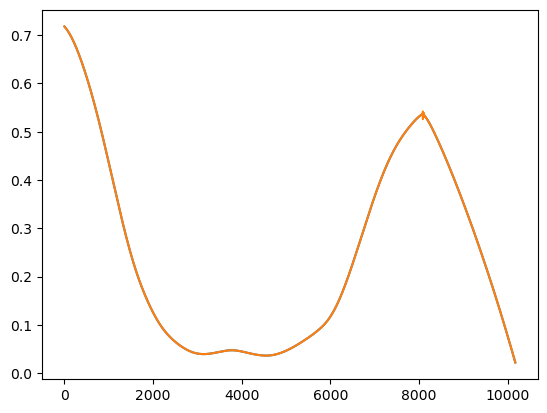

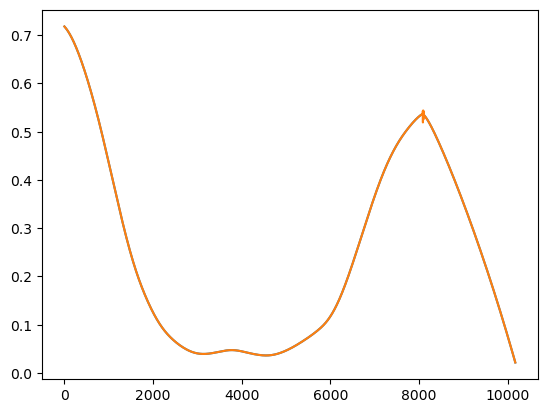

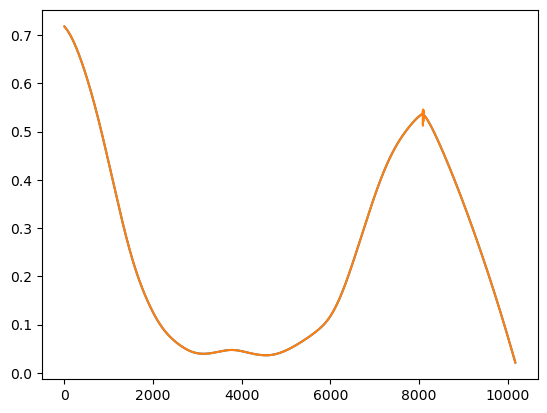

TREND SPLIT 0: SMAPE avg 0.0008959987966191206, RMSE avg 1.0256414646198219e-05


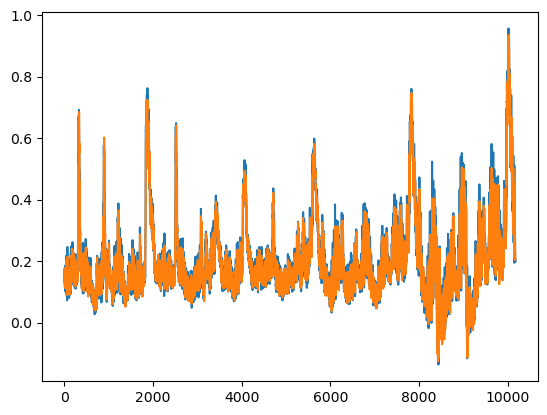

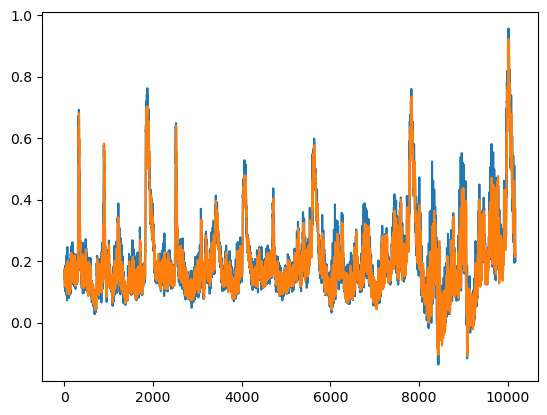

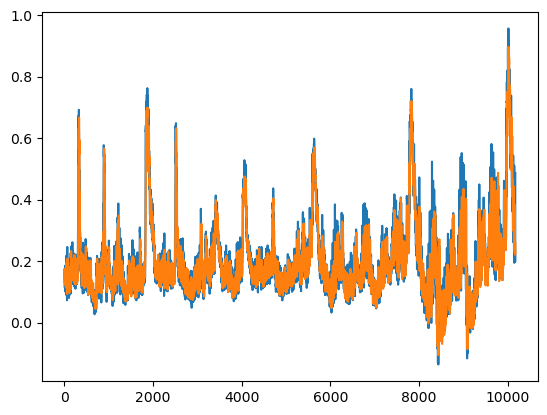

TREND SPLIT 0: SMAPE avg 9.200391039715738, RMSE avg 0.03105242818197297


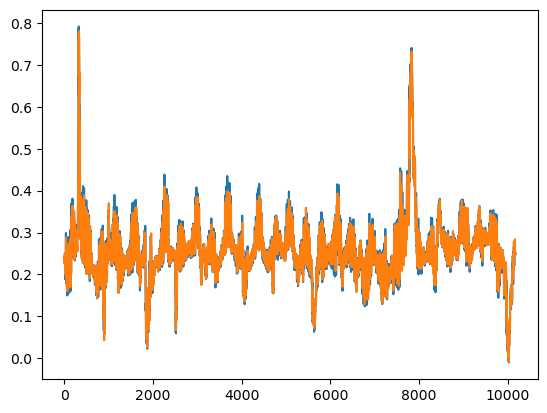

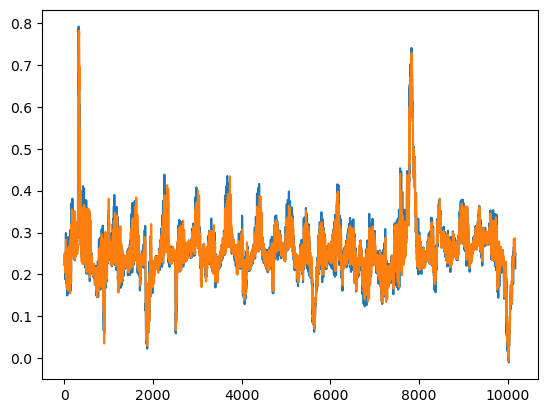

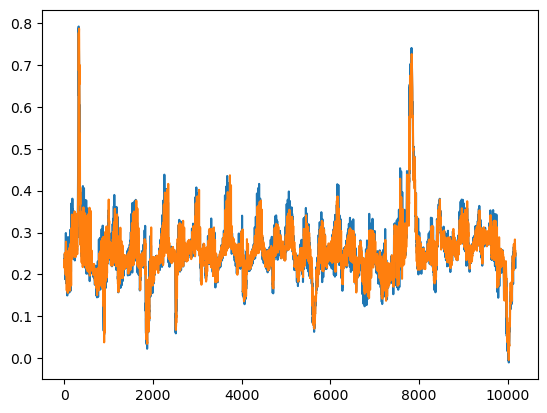

TREND SPLIT 0: SMAPE avg 2.817429072892576, RMSE avg 0.014578597498945738
402


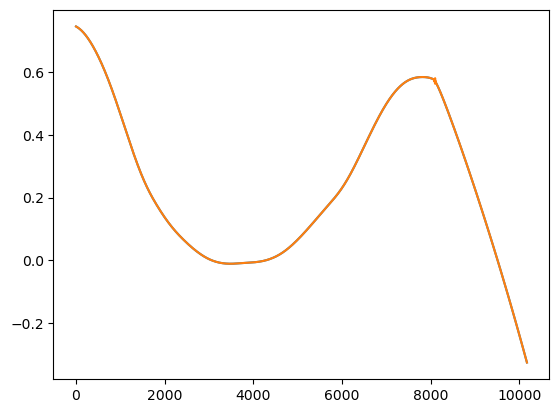

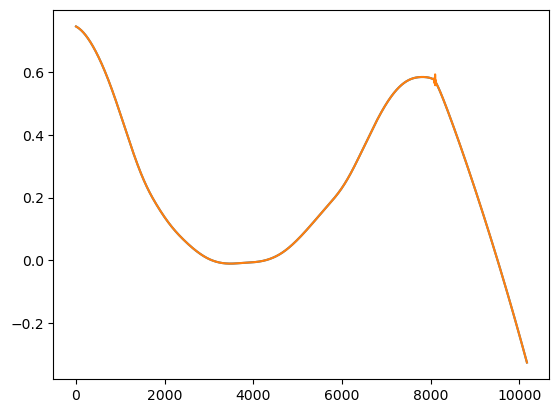

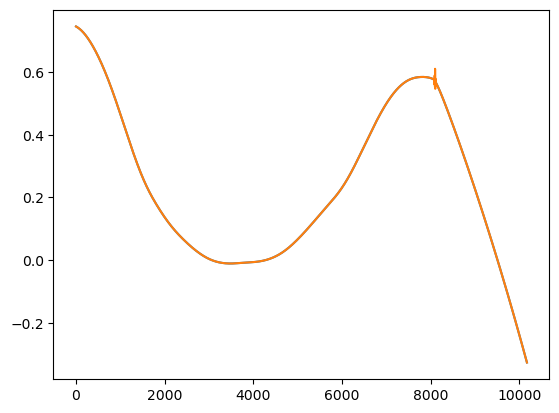

TREND SPLIT 0: SMAPE avg 0.0015881156462115575, RMSE avg 1.9196564156182467e-05


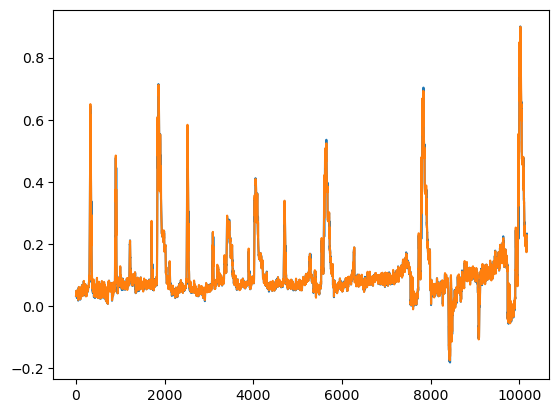

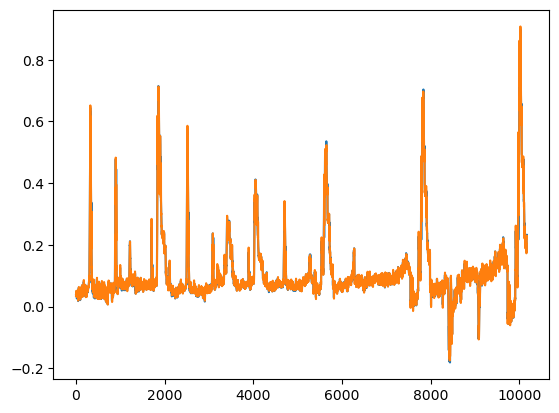

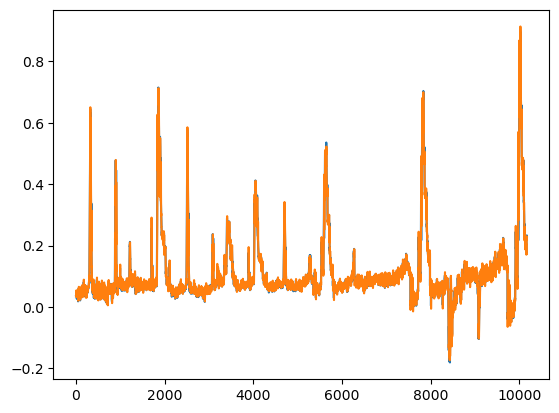

TREND SPLIT 0: SMAPE avg 5.847829721820962, RMSE avg 0.010183757305052554


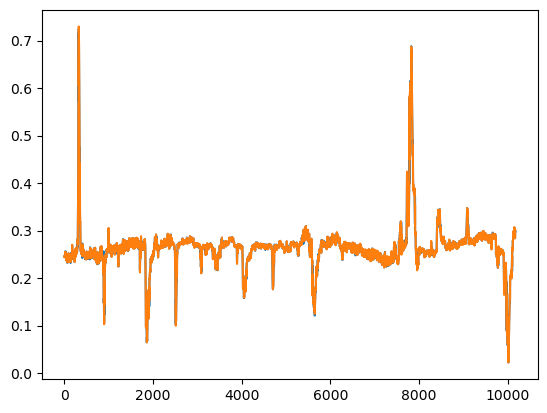

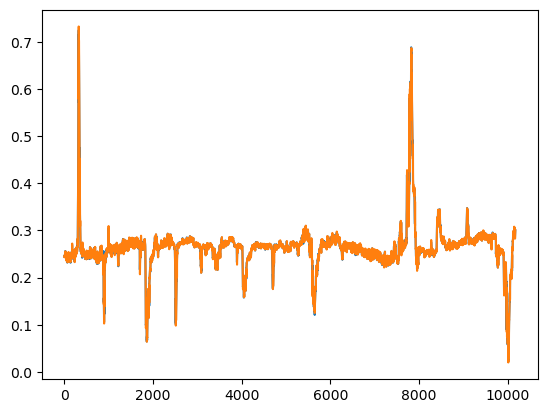

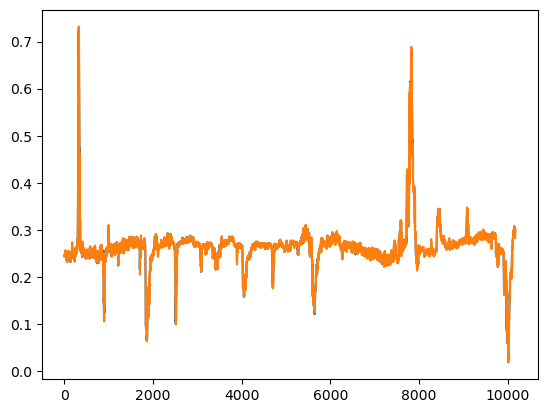

TREND SPLIT 0: SMAPE avg 0.7451096495699542, RMSE avg 0.004043251317782241
403


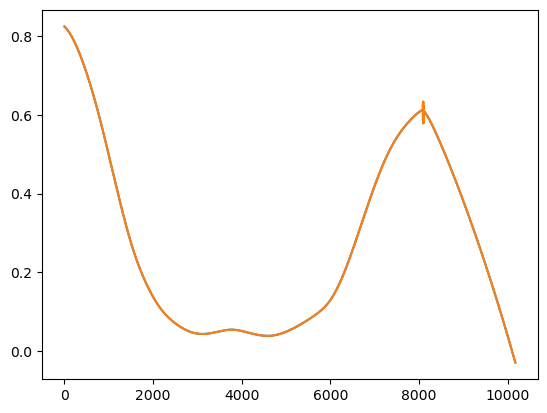

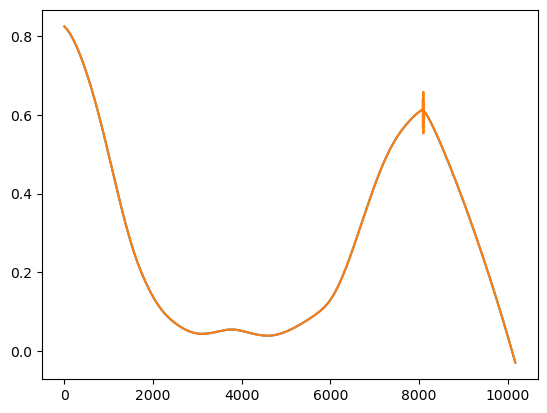

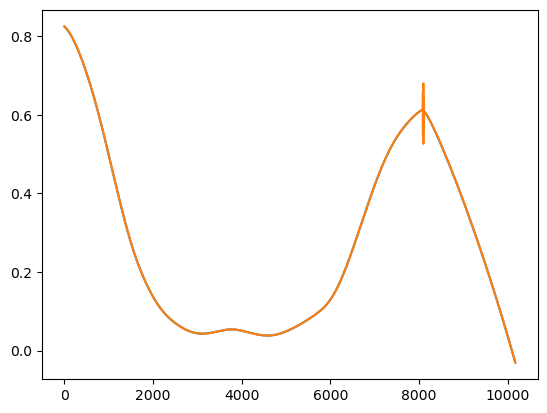

TREND SPLIT 0: SMAPE avg 0.003382438042545444, RMSE avg 4.446293337262093e-05


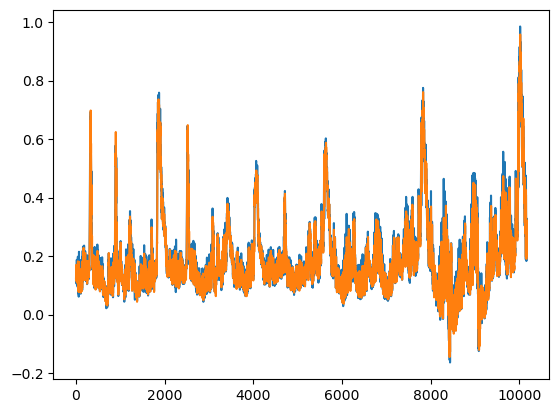

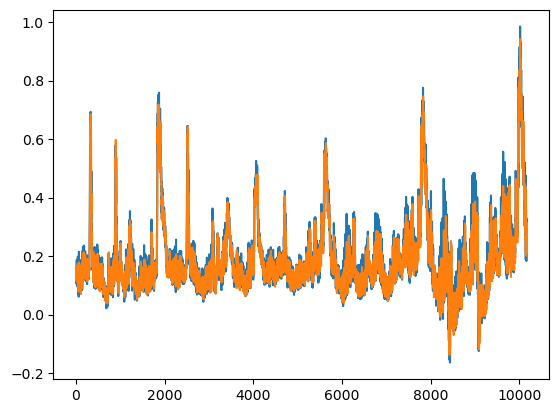

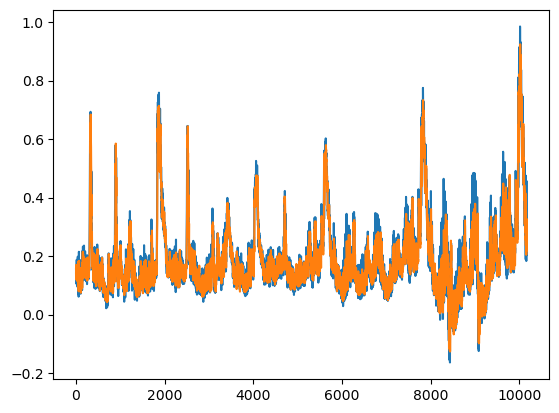

TREND SPLIT 0: SMAPE avg 9.254916829084594, RMSE avg 0.029469424807509383


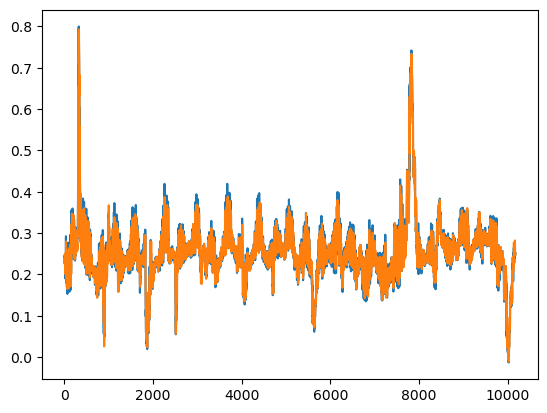

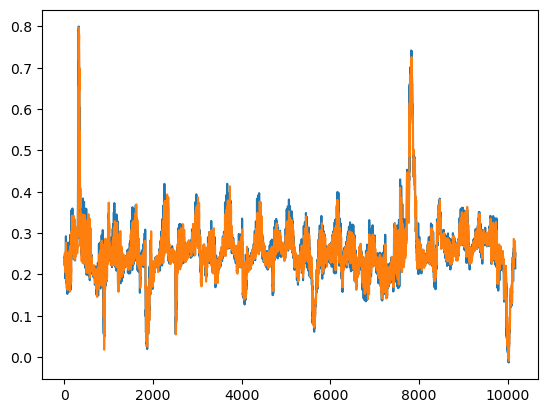

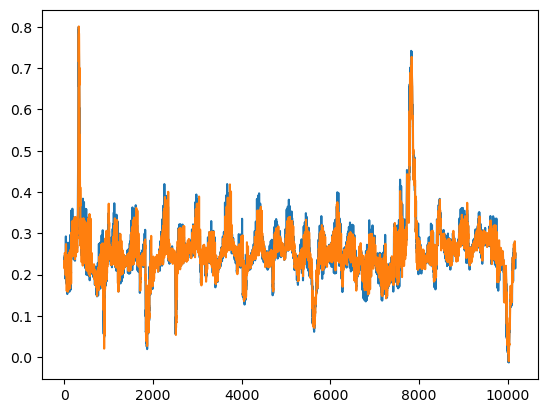

TREND SPLIT 0: SMAPE avg 2.7182513673239392, RMSE avg 0.013761655238768515
415


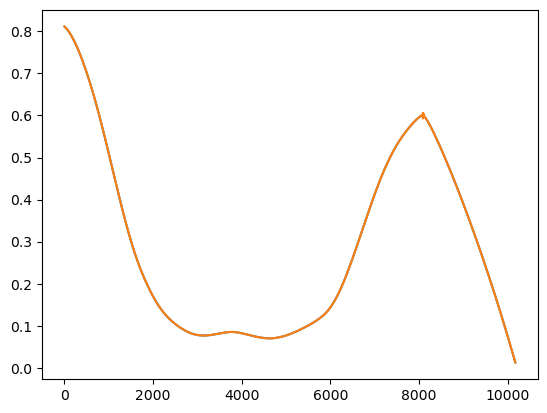

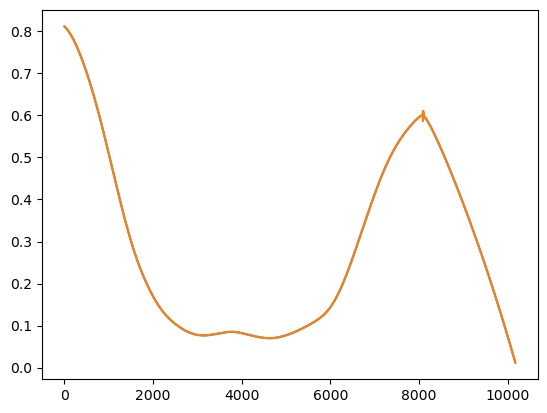

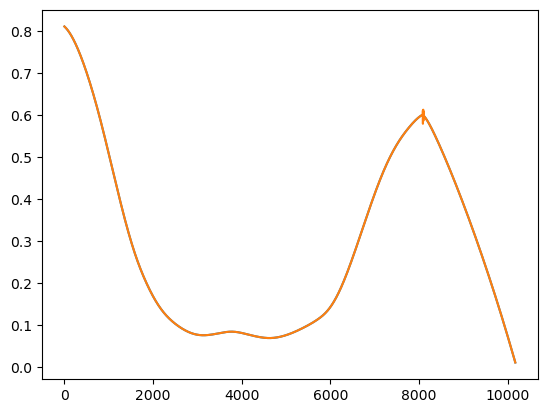

TREND SPLIT 0: SMAPE avg 0.0007286480259434216, RMSE avg 9.480416931786109e-06


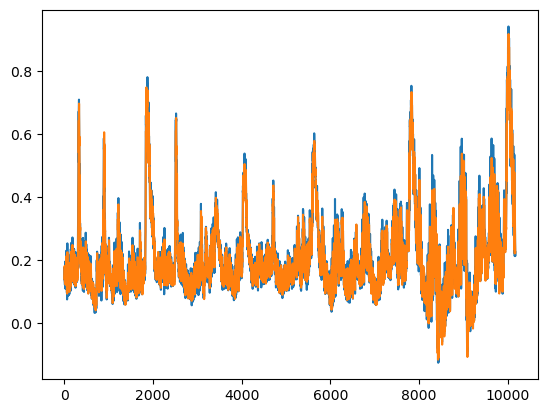

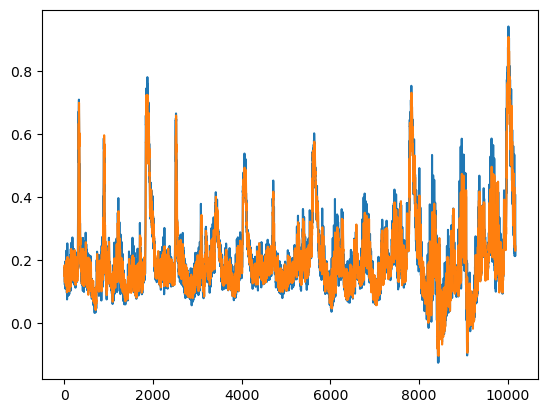

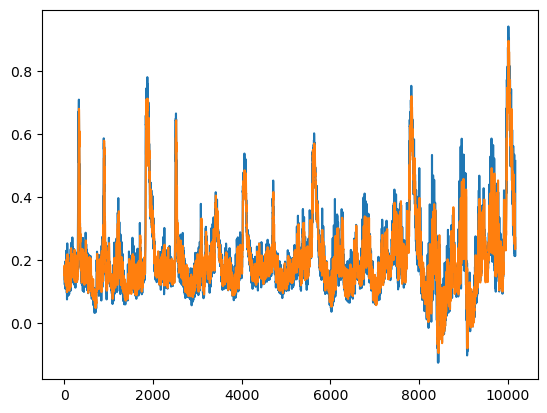

TREND SPLIT 0: SMAPE avg 8.706979055392766, RMSE avg 0.031157404706822957


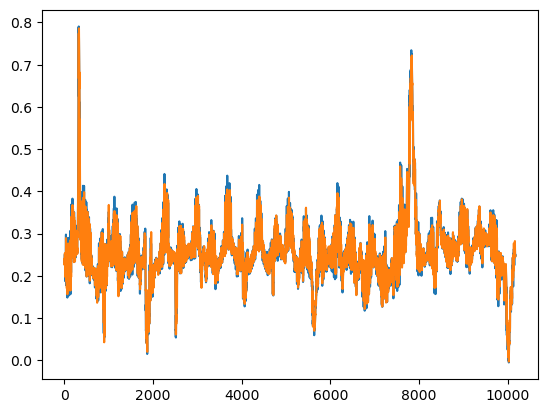

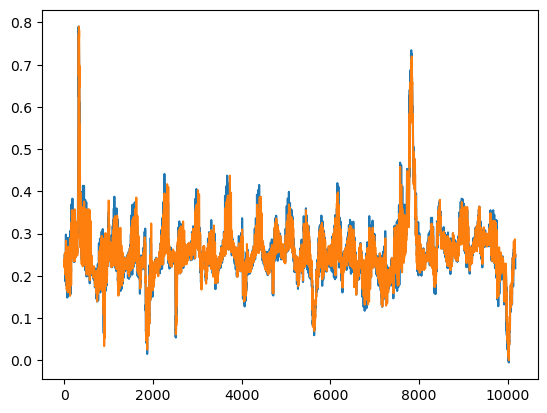

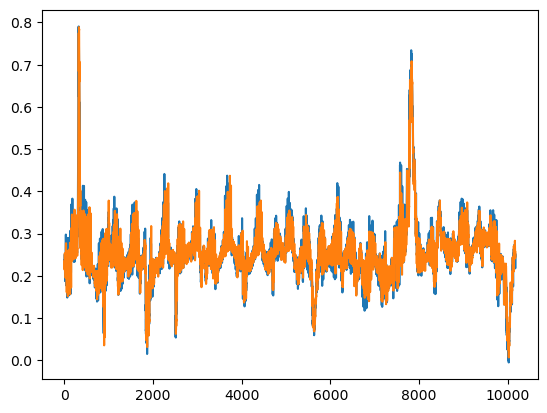

TREND SPLIT 0: SMAPE avg 2.8130635864687417, RMSE avg 0.014665961532205653


In [86]:
# 이거 돌리면 된다~~~
code_list = ["1018680", "1018640", "1018662", "1018683"]
for code in code_list:
    pre = Preprocessing_minmax(code)
    pre.merging()
    pre.do_blocking()
    pre.do_minmax_and_pca()
    full_data = pre.pca_full_data
    full_data_test = pre.pca_full_data_test
    full_data_final_test = pre.pca_full_data_final_test
    model = predict_model(full_data_final_test, code)
    model.fit_VAR_model("trend", is_final = 1)
    model.fit_VAR_model("seasonal", is_final = 1)
    model.fit_VAR_model("residual", is_final = 1)


In [20]:
pre = Preprocessing_minmax("1018680")
pre.merging()
pre.do_blocking()
pre.do_minmax_and_pca()

415


In [21]:
full_data = pre.pca_full_data
full_data_test = pre.pca_full_data_test
full_data_final_test = pre.pca_full_data_final_test

In [71]:
mmmy_model = predict_model(full_data, "1018680")

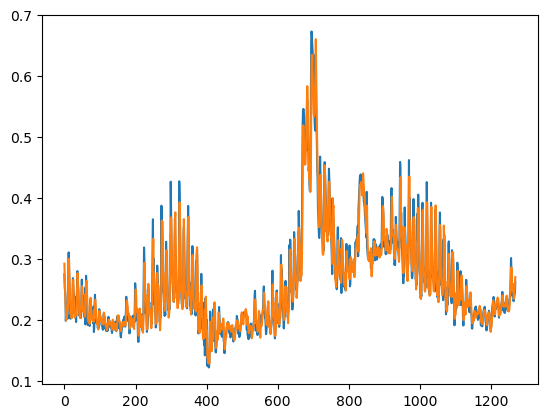

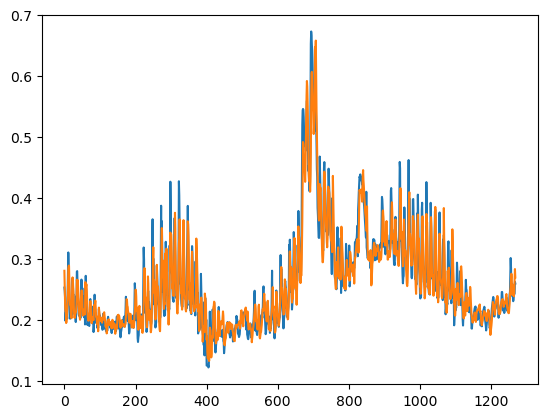

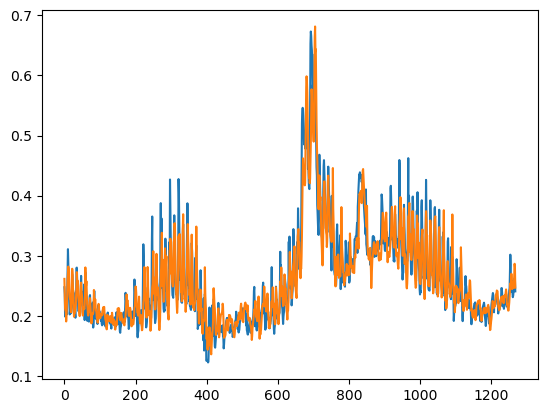

TREND SPLIT 0: SMAPE avg 3.3611908636337398, RMSE avg 0.020191983363922226


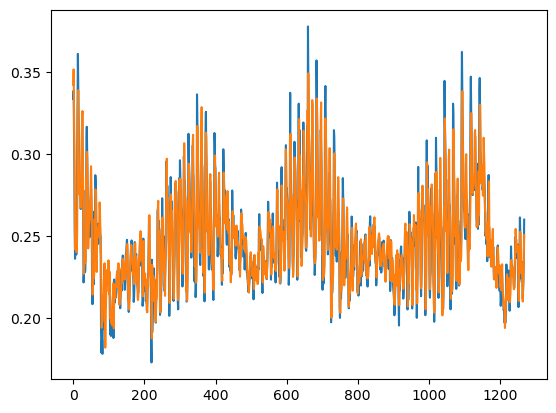

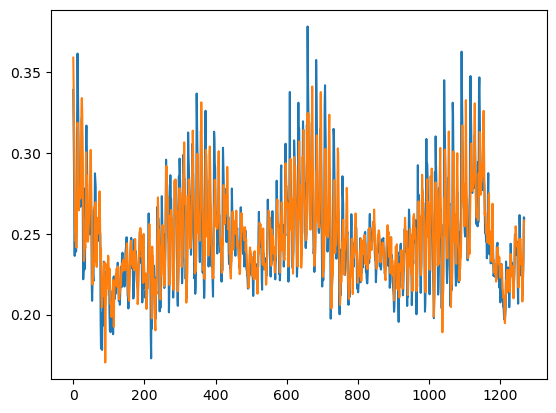

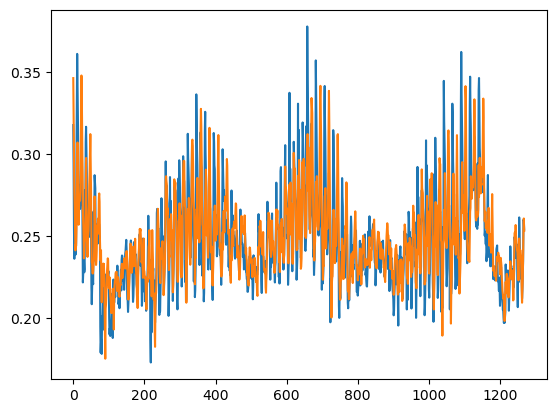

TREND SPLIT 1: SMAPE avg 2.304737413561025, RMSE avg 0.013196945710646932


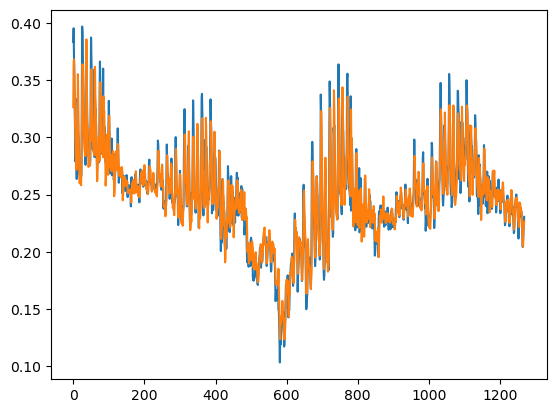

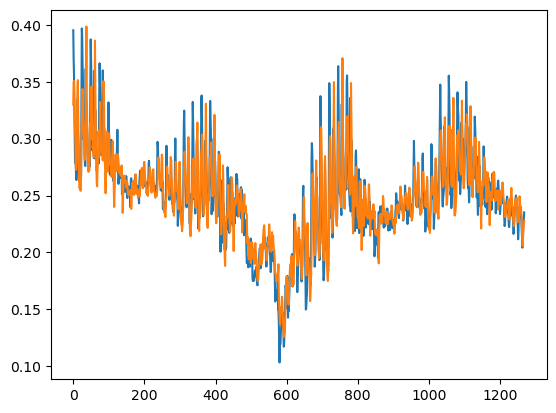

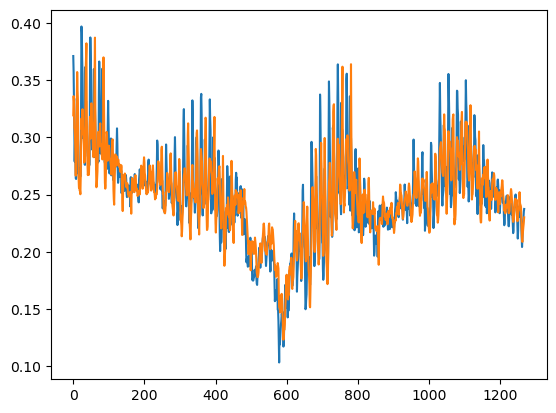

TREND SPLIT 2: SMAPE avg 2.5644228498308257, RMSE avg 0.014138598601555329


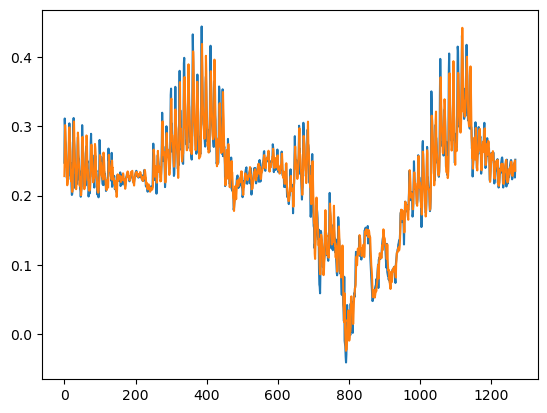

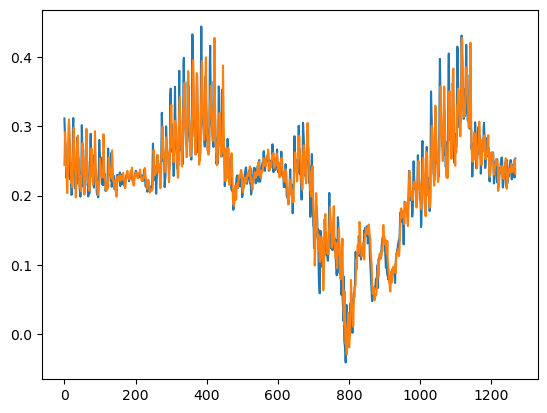

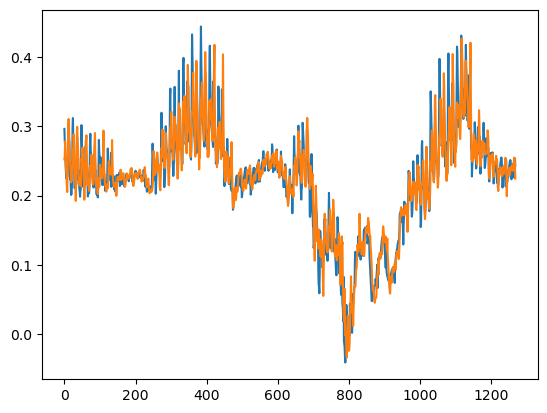

TREND SPLIT 3: SMAPE avg 4.696105299650453, RMSE avg 0.01612672200905882


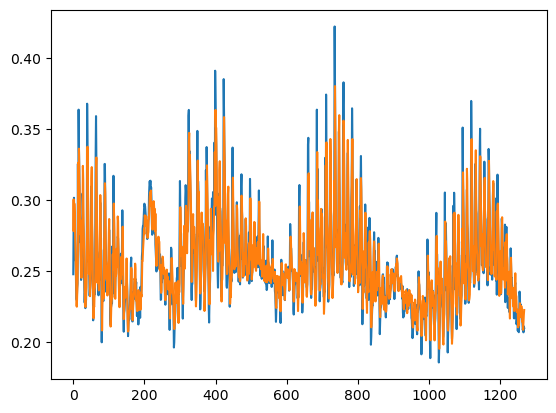

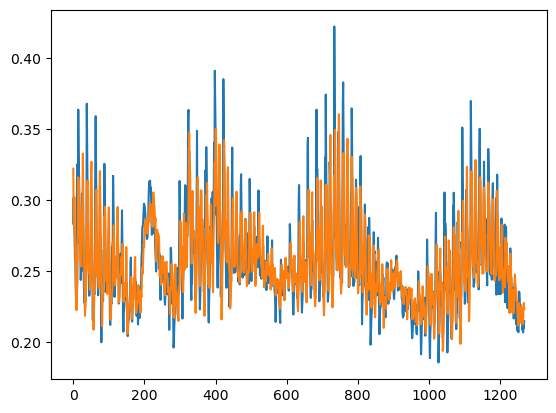

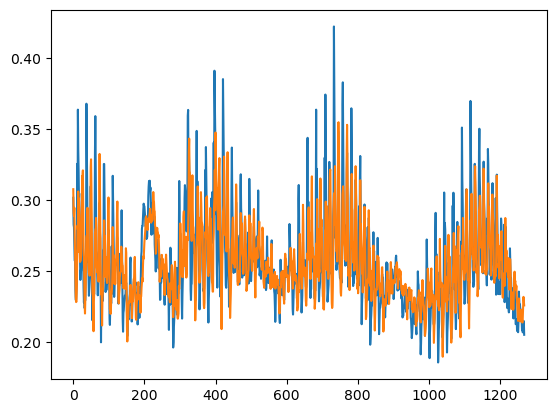

TREND SPLIT 4: SMAPE avg 2.5137816428078255, RMSE avg 0.0150069586674783


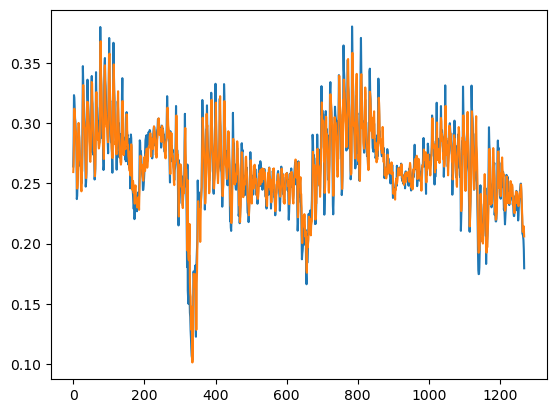

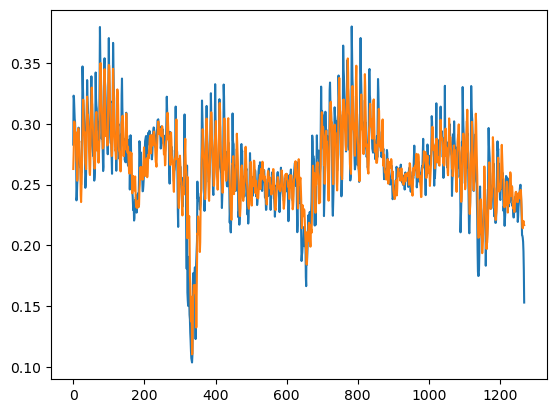

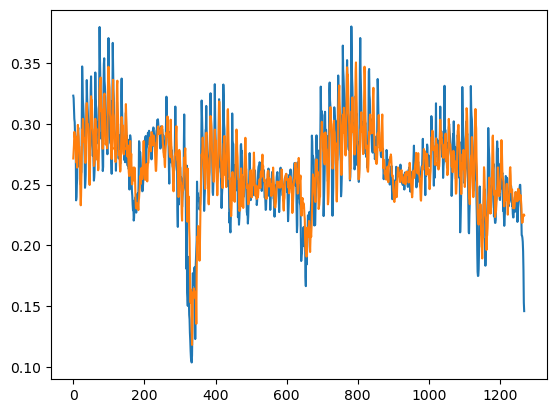

TREND SPLIT 5: SMAPE avg 2.428295204475258, RMSE avg 0.013780245920940928


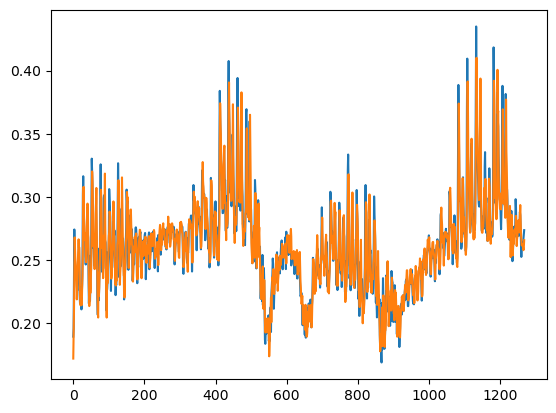

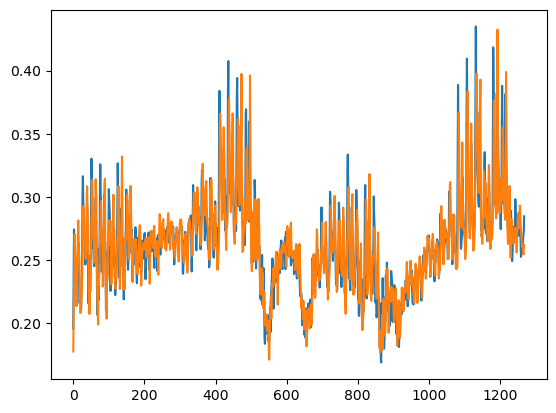

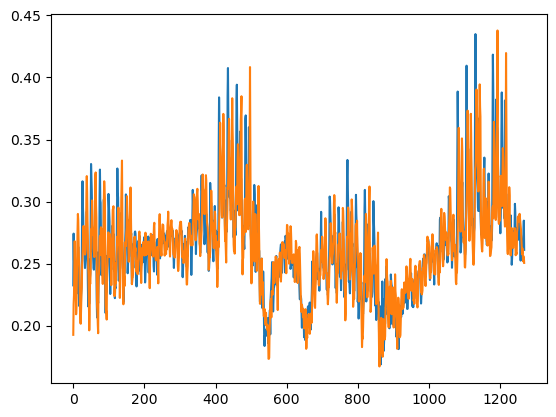

TREND SPLIT 6: SMAPE avg 2.5464980731790363, RMSE avg 0.01529352621424791


In [78]:
mmmy_model.fit_VAR_model("residual", is_final = 0)

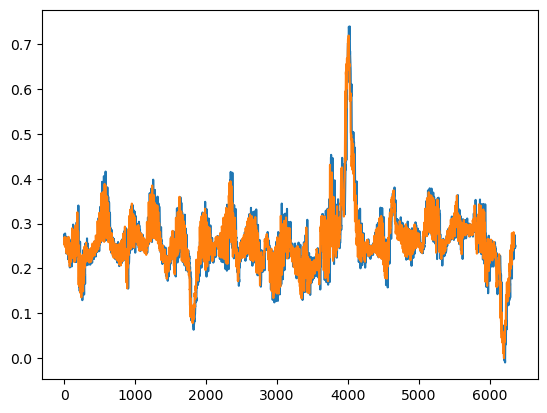

In [83]:
residual_VAR_eval = mmmy_model.eval_VAR_model(full_data_test, "residual")
plt.plot(full_data_test[2][0][1], label = "actual")
plt.plot(residual_VAR_eval[:, 0, :], label = "prediction")
plt.show()
# seasonal_VAR_eval[:, 1, :]

In [ ]:
mmmy_model.eval_VAR_model("residual", is_final = 0)


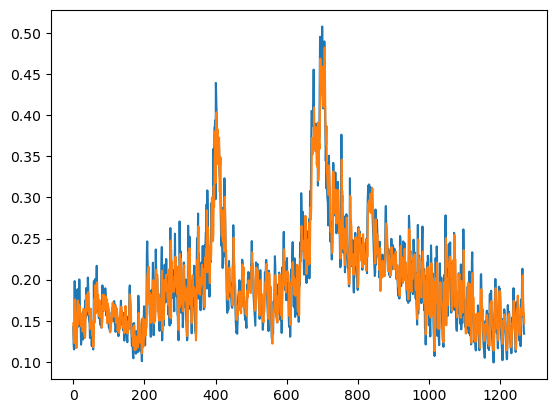

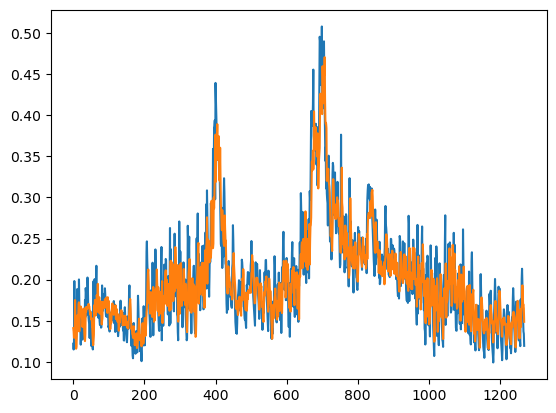

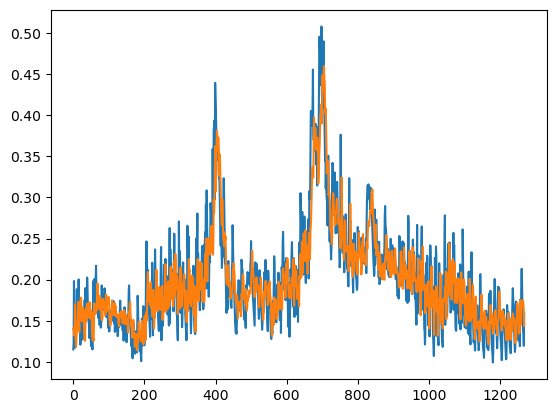

TREND SPLIT 0: SMAPE avg 5.5268944093462595, RMSE avg 0.024377795380350058


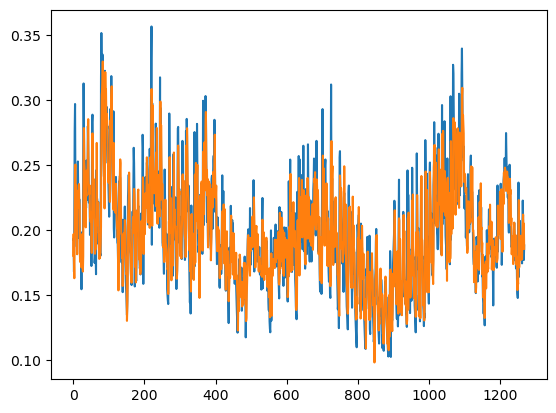

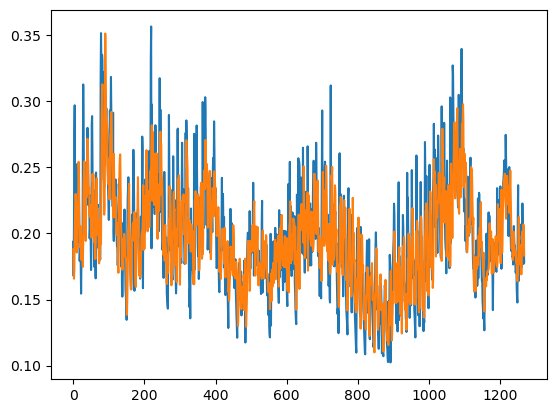

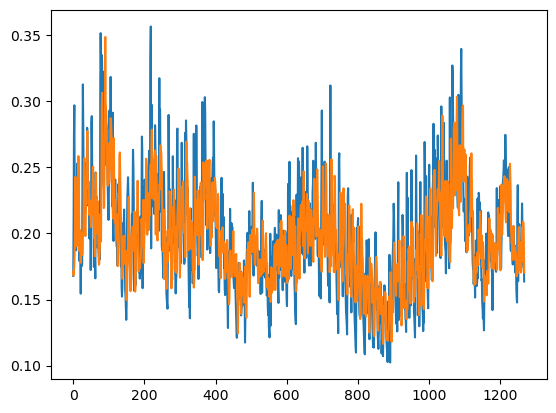

TREND SPLIT 1: SMAPE avg 5.216627526071977, RMSE avg 0.023510000926628364


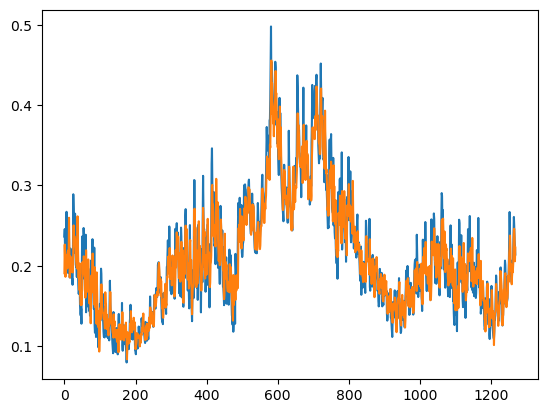

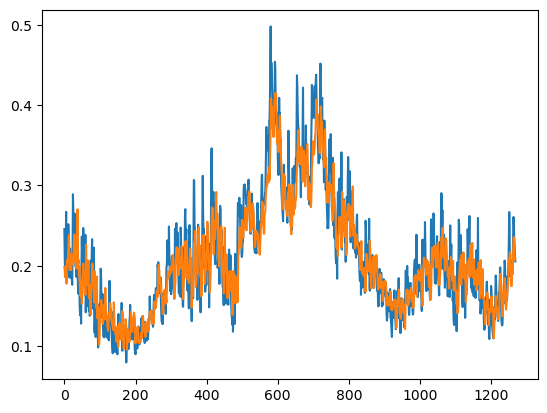

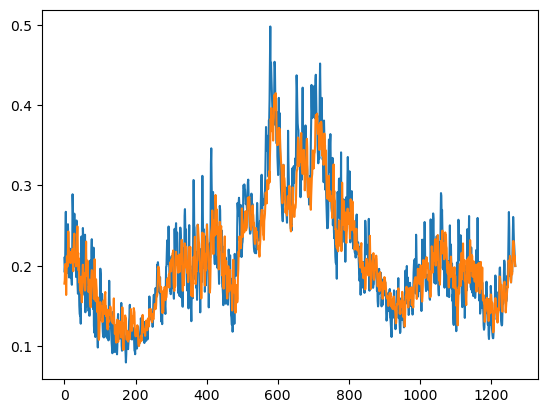

TREND SPLIT 2: SMAPE avg 5.317641064871568, RMSE avg 0.023916518630186703


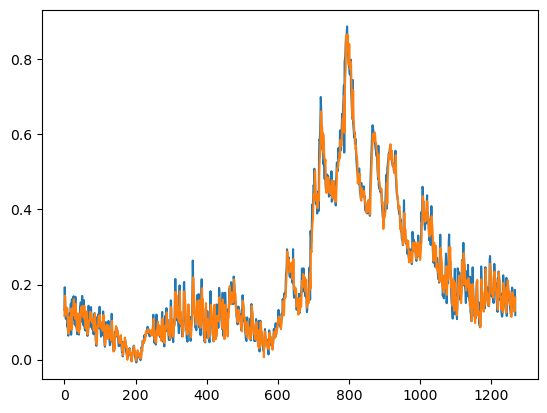

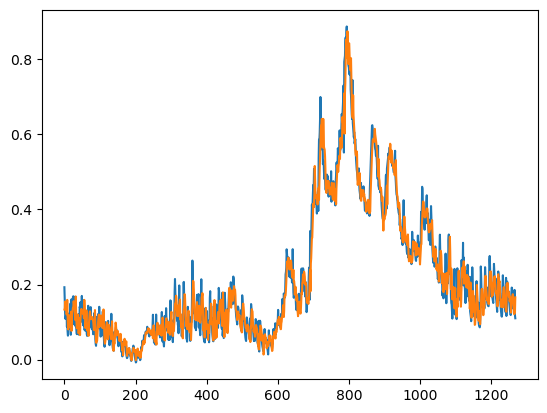

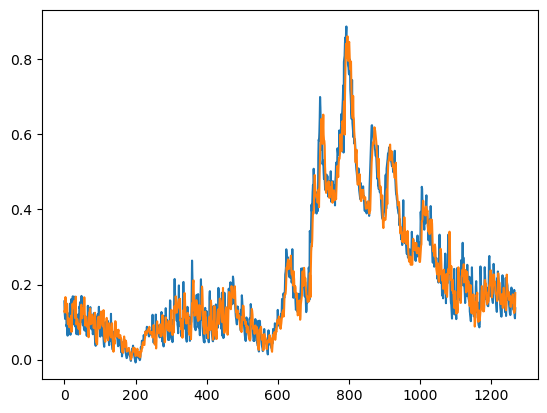

TREND SPLIT 3: SMAPE avg 9.91614255835111, RMSE avg 0.029070590358599692


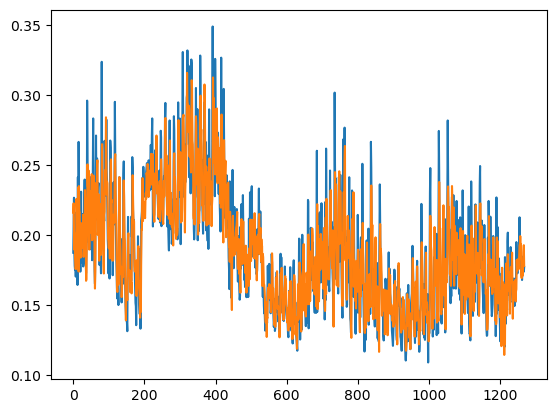

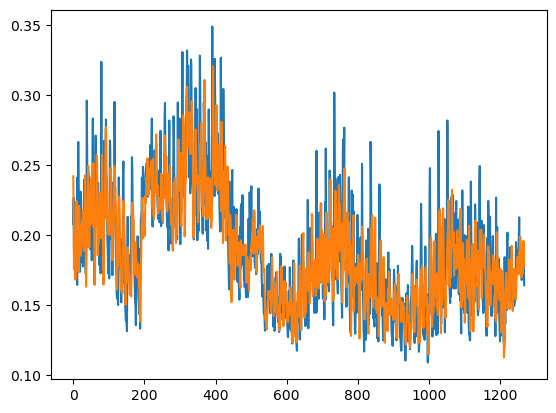

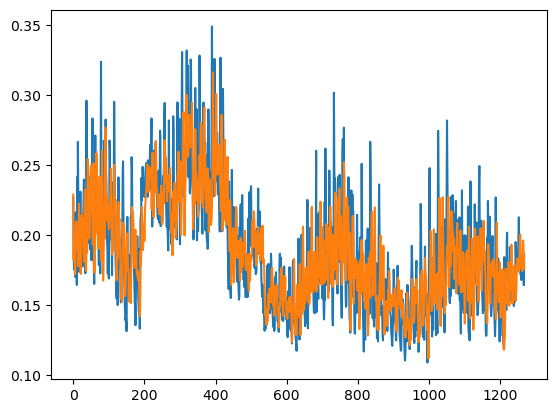

TREND SPLIT 4: SMAPE avg 5.2917834570794335, RMSE avg 0.022592519985785542


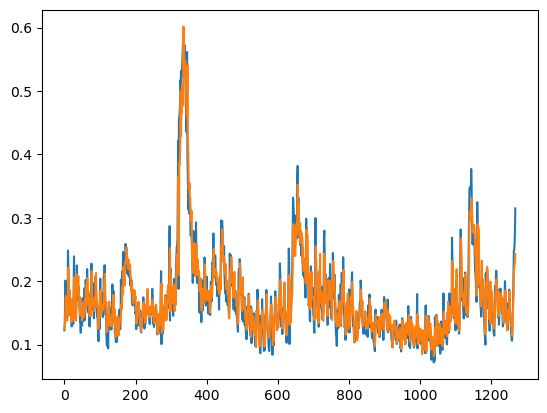

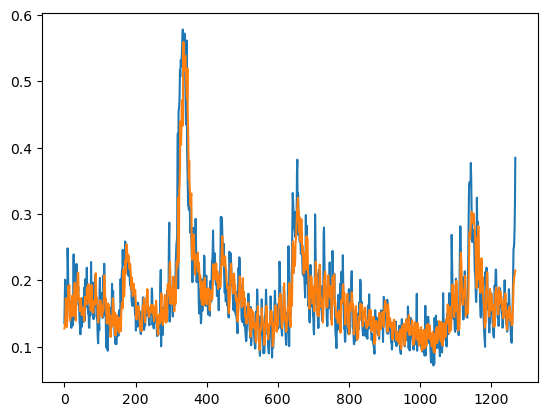

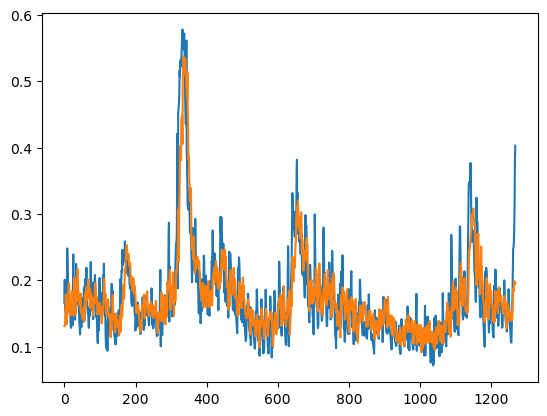

TREND SPLIT 5: SMAPE avg 6.620051954937673, RMSE avg 0.025978662940179285


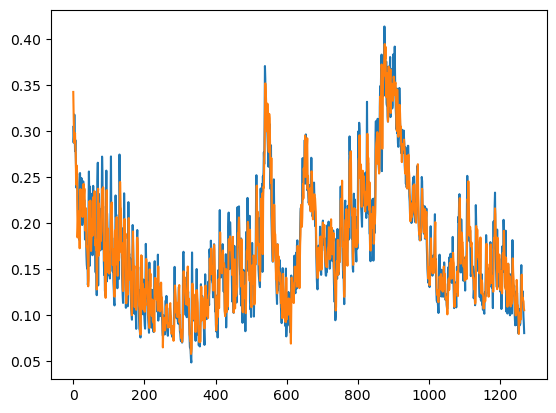

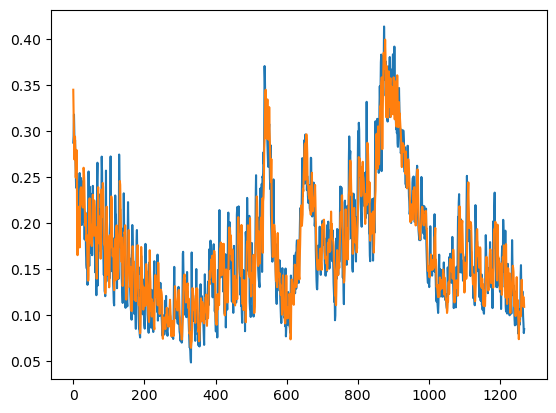

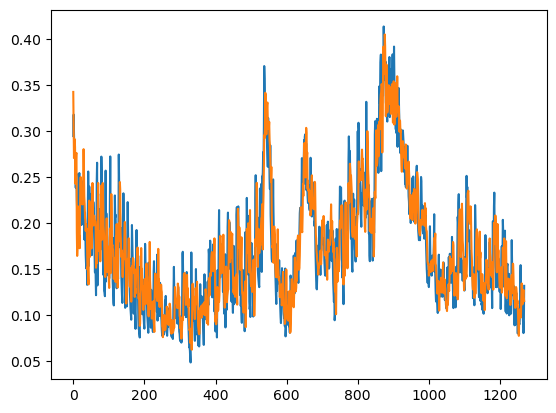

TREND SPLIT 6: SMAPE avg 6.871384074002004, RMSE avg 0.02477646735472203


In [72]:
mmmy_model.fit_VAR_model("seasonal", is_final = 0)

In [73]:
seasonal_VAR_eval = mmmy_model.eval_VAR_model(full_data_test, my_type = "seasonal")

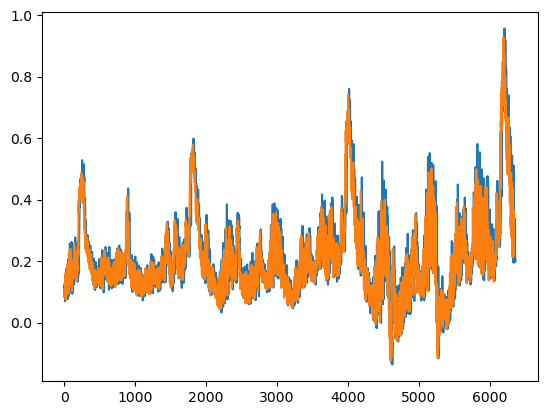

In [74]:
plt.plot(full_data_test[1][0][1], label = "actual")
plt.plot(seasonal_VAR_eval[:, 0, :], label = "prediction")
plt.show()
# seasonal_VAR_eval[:, 1, :]
# seasonal_VAR_eval[:, 2, :]

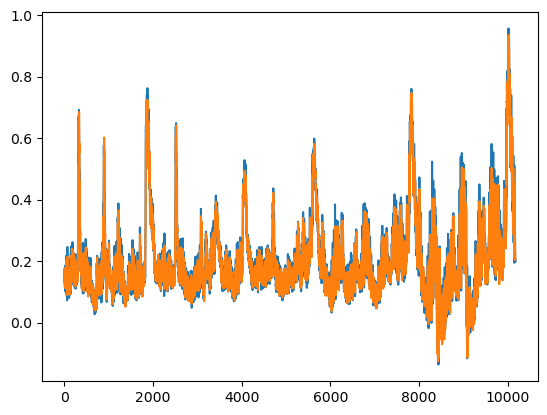

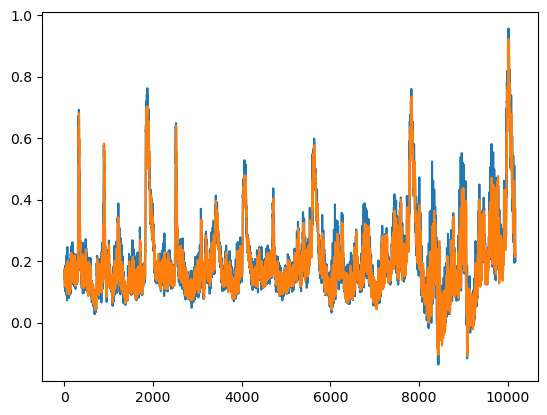

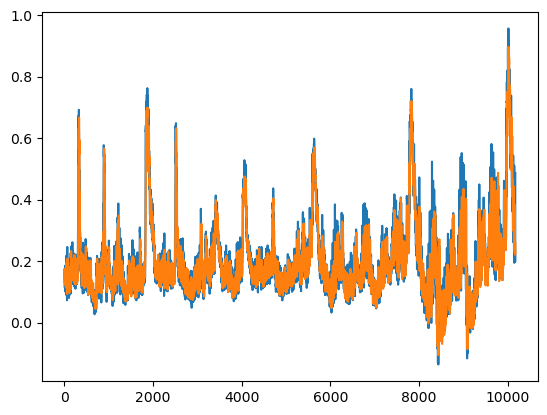

TREND SPLIT 0: SMAPE avg 9.200391039715738, RMSE avg 0.03105242818197297


In [75]:
var_crazy_model = predict_model(full_data_final_test, "seasonal")
var_crazy_model.fit_VAR_model("seasonal", is_final = 1)

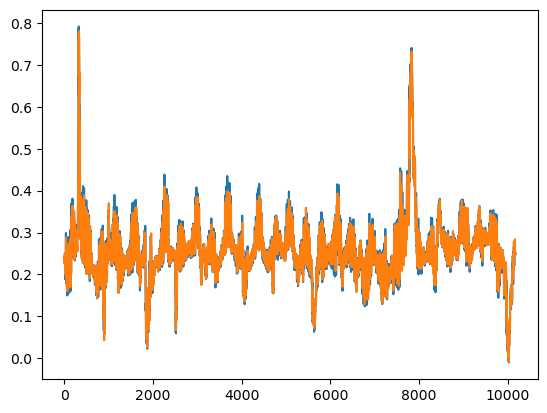

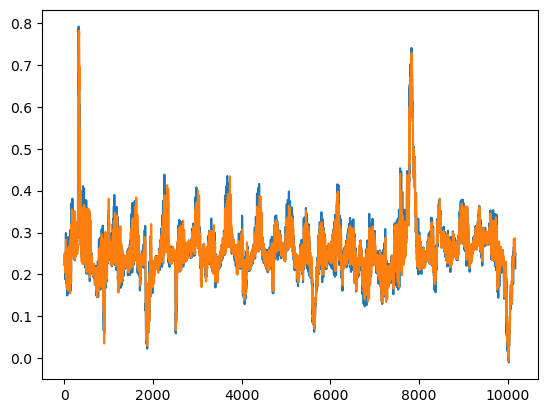

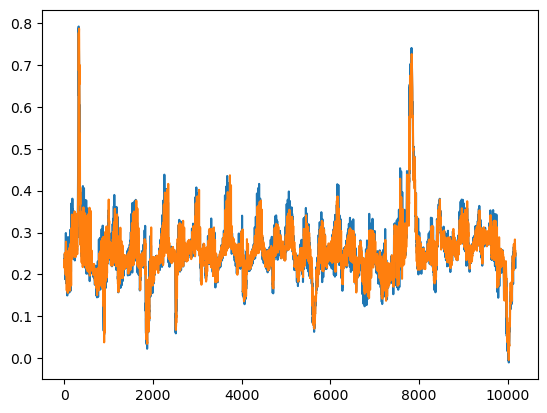

TREND SPLIT 0: SMAPE avg 2.817429072892576, RMSE avg 0.014578597498945738


In [85]:
var_crazy_model = predict_model(full_data_final_test, "1018680")
var_crazy_model.fit_VAR_model("residual", is_final = 1)

In [56]:
len(pd.concat([full_data_final_test[1][0][0].loc[-15: , :], full_data_final_test[1][0][2]]))

50875

In [66]:
full_data_final_test[1][0][0][-15:]

,pca1,pca2,pca3,pca4
40685,0.008580,-0.147098,-0.077629,0.050651
40686,0.016370,-0.109701,-0.075035,0.033833
40687,0.008489,-0.141005,-0.079570,0.045810
40688,-0.000471,-0.119390,-0.066662,-0.005504
40689,0.002172,-0.071511,-0.084450,0.045313
40690,-0.001194,-0.026490,-0.087482,0.040689
40691,-0.022287,-0.053423,-0.084591,0.036954
40692,-0.077742,-0.147654,-0.072406,0.024872
40693,-0.113532,-0.090856,-0.086806,0.066814
40694,-0.152136,-0.102531,-0.085981,0.071625


In [63]:
len(full_data_final_test[1][0][0])

40700

In [55]:
full_data_final_test[1][0][3]

,0
0,0.132006
1,0.163178
2,0.158330
3,0.147733
4,0.153551
...,...
10170,0.197541
10171,0.205064
10172,0.369472
10173,0.487003


In [51]:
full_data_test[1][0][1]

,0
0,0.115617
1,0.119170
2,0.117110
3,0.111107
4,0.082360
...,...
6354,0.230396
6355,0.226878
6356,0.211904
6357,0.197541


In [39]:
file_names = ["trend", "seaosnal", "residual"]

for i in range(len(full_data)):
    for j in range(7):
        full_data[i][j][0].to_csv(f"./data_PCA/{file_names[i]}_split{j}_x_train.csv", index = False)
        full_data[i][j][1].to_csv(f"./data_PCA/{file_names[i]}_split{j}_y_train.csv", index = False)
        full_data[i][j][2].to_csv(f"./data_PCA/{file_names[i]}_split{j}_x_valid.csv", index = False)
        full_data[i][j][3].to_csv(f"./data_PCA/{file_names[i]}_split{j}_y_valid.csv", index = False)

In [41]:
full_data[1][0]

[          pca1      pca2      pca3      pca4
 0    -0.482990  0.035227  0.109131 -0.114712
 1    -0.510003 -0.000403  0.111273 -0.112510
 2    -0.536683  0.061307  0.109040 -0.124455
 3    -0.567970 -0.004207  0.115844 -0.108636
 4    -0.569015 -0.010041  0.112272 -0.090485
 ...        ...       ...       ...       ...
 5082 -0.084478 -0.005231 -0.027202 -0.049064
 5083 -0.058850 -0.000040 -0.025064 -0.071363
 5084 -0.083442  0.042750 -0.035451 -0.053650
 5085 -0.119373  0.044527 -0.037821 -0.034293
 5086 -0.093201  0.005430 -0.041351 -0.011743
 
 [5087 rows x 4 columns],
              0
 0     0.323780
 1     0.306130
 2     0.325986
 3     0.349823
 4     0.410212
 ...        ...
 5082  0.172848
 5083  0.146062
 5084  0.124041
 5085  0.127461
 5086  0.137916
 
 [5087 rows x 1 columns],
           pca1      pca2      pca3      pca4
 0    -0.090407 -0.007001 -0.049231  0.030702
 1    -0.083114 -0.008324 -0.068685  0.099813
 2    -0.087953 -0.020777 -0.066072  0.105993
 3    -0.098165 

In [8]:
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

from sklearn.metrics import mean_squared_error 

import statsmodels.api as sm
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

import tensorflow as tf
from tensorflow import keras

# from pyFTS.common import Transformations, Util as cUtil, Membership as mf
# from pyFTS.benchmarks import benchmarks as bchmk, Util as bUtil, Measures
# from pyFTS.partitioners import CMeans, Grid, FCM, Huarng, Entropy, Util as pUtil
# from pyFTS.models.multivariate import common, variable, mvfts
# from pyFTS.models import hofts
# from pyFTS.models import chen

import seaborn as sn

import math

from joblib import dump, load

2023-10-21 18:06:39.958659: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


In [11]:
class predict_model:
    
    def __init__(self, df, code):
        self.type_dict = {'trend': 0, 'seasonal': 1, 'residual': 2}
        
        self.dataset = df
        self.code = code # 수위 예측 지점 코드
        
        self.trend_model = 0
        
        self.scaler_X = []
        self.scaler_y = []
        self.seasonal_model = 0
        
        self.df = []
    
    @staticmethod
    def SMAPE(y_test, y_pred):
        y_test = y_test.to_numpy(); y_pred = y_pred.to_numpy()
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100

    @staticmethod
    def RMSE(y_test, y_pred):
        return np.sqrt(mean_squared_error(y_test, y_pred))
    
    @staticmethod
    def SMAPE_np(y_test, y_pred):
        return np.mean((np.abs(y_test-y_pred))/(np.abs(y_test)+np.abs(y_pred)))*100
    
    @staticmethod
    def RMSE_np(y_test, y_pred):
        return np.mean((y_test - y_pred)**2)
        
    def fit_VAR_model(self, my_type, is_final, lag = 15, step = 3):
        given_data = self.dataset[self.type_dict[my_type]] # trend
        
        least_rmse = 1000

        for idx, block_data in enumerate(given_data):
            X_train = block_data[0]
            y_train = block_data[1]
            X_valid = block_data[2]
            y_valid = block_data[3]
            
            SMAPE_sum = 0
            RMSE_sum = 0
            
            df_train = pd.merge(y_train, X_train, left_index=True, right_index=True, how='inner')
            df_valid = pd.merge(y_valid, X_valid, left_index=True, right_index=True, how='inner')

            print(f"Modeling {my_type} component... SPLIT %d"%idx, end = "\r")
            premodel = VAR(df_train)
            model = premodel.fit(lag)

            df_valid = pd.concat([df_train.loc[-lag: , :], df_valid])
            

            for i in range(0, len(df_valid)-lag-step):
                lagged_values = df_valid.values[i: i+lag]
                forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_train.columns)
                SMAPE_sum += self.SMAPE(forecast.iloc[:step, [0]], df_valid.iloc[i+lag: i+step+lag, [0]])
                RMSE_sum += self.RMSE(forecast.iloc[:step, [0]], df_valid.iloc[i+lag: i+step+lag, [0]]) 
            
            print(f"TREND SPLIT {idx}: SMAPE avg {SMAPE_sum / (len(df_valid) - lag)}, RMSE avg {RMSE_sum / (len(df_valid) - lag)}")
            
            if least_rmse > RMSE_sum / (len(df_valid) - lag):
                least_rmse = RMSE_sum / (len(df_valid) - lag)
                best_model = model
                
        if is_final == 1:
            dump(best_model, f'{my_type}_{self.code}_model_final.joblib')
        else:
            dump(best_model, f'{my_type}_{self.code}_model.joblib')
        
    def eval_VAR_model(self, df, my_type):
        
        lag = 15; step = 3
        
        model = load(f'{my_type}_{self.code}_model.joblib')
        
        given_data = df[self.type_dict[my_type]]
        
        X_test = given_data[0][0]
        y_test = given_data[0][1]
        
        df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
        pred = []
        
        for i in range(0, len(df_test)-lag-step):
            lagged_values = df_test.values[i: i+lag]
            forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
            pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])
            
        return np.array(pred)


    def pred_VAR_model(self, my_type):
        
        df = self.dataset
        
        lag = 15; step = 3
        
        model = load(f'{my_type}_{self.code}_model_final.joblib')
        
        given_data = df[0]
        
        X_test = given_data[0][0]
        y_test = given_data[0][1]
        
        df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
        pred = []
        
        i = len(df_test)-lag
        lagged_values = df_test.values[i: i+lag]
        forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
        pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])
            
        return np.array(pred)
        
    ###################         

    def make_dataset(self, X_df, y_df, time_step = 30, y_step = 3):
        new_X_df = []
        new_y_df = []
        X_df = pd.concat([X_df, y_df], axis=1)
        for i in range(len(X_df) - time_step - y_step + 1):
            new_X_df.append(np.array(X_df.iloc[i:i + time_step])) # i ~ i + time_step - 1
            new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step])) # i + time_step ~ i + time_step + y_step - 1
        return np.array(new_X_df), np.array(new_y_df)
    
    
    def calculate_metrics(self, true, pred):
        true = pd.DataFrame(true)
        pred = pd.DataFrame(pred)
        mae = (true - pred).abs().mean()
        mape = (true - pred).abs().div(true).mean() * 100
        rmse = np.sqrt(((true - pred) ** 2).mean())
        return {
            "mae": mae,
            "mape": mape,
            "rmse": rmse,
        }
    
    def Bi_Seq2_model(self, feature_num, time_step, y_step):

        model = keras.Sequential()
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'tanh', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'tanh')))
        model.add(keras.layers.RepeatVector(y_step))
        model.add(keras.layers.LSTM(64, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.LSTM(128, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
        #model.compile(optimizer = 'nadam', loss = 'mse')
        #model.summary()

        return model
    
    def Bi_Seq2_fit(self, model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):

        model.compile(loss='mean_squared_error', optimizer = 'nadam')
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

        history = model.fit(X_train, y_train, 
                            epochs = epochs,
                            validation_data = (X_valid, y_valid), 
                            callbacks = [early_stop],
                            shuffle = False)
        return history
    
    def fit_Bi_Seq2(self, my_type, is_final, time_step = 30, y_step = 3, patience = 100, epochs = 1000):
        
        self.scaled_data = self.dataset[self.type_dict[my_type]]
        
        pred = []
        
        with tf.device('/device:GPU:0'):
            least_rmse = 1000
            for i in range(len(self.dataset[0])):
                (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
                (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

                model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

                history = self.Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

                pred_temp = model.predict(lstm_X_valid)

                rmse = 0

                for j in range(y_step):
                    pred.append(pred_temp)
                    mat = self.calculate_metrics(lstm_y_valid[:, j], pred_temp[:, j])
                    print(mat)
                    rmse = rmse + mat['rmse'][0]

                    plt.plot(lstm_y_valid[:, j], label = 'actual')
                    plt.plot(pred_temp[:, j], label = 'prediction')
                        # print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
                    plt.legend()
                    plt.show()

                rmse = rmse / y_step

                if rmse < least_rmse:
                    least_rmse = rmse
                    best_time_step = time_step
                    best_model = model
        
        if is_final == 1:
            best_model.save(f'{my_type}_{self.code}_model_final.h5')
        else:
            best_model.save(f'{my_type}_{self.code}_model.h5')
    
    def eval_Bi_Seq2(self, df, my_type): # 모델 평가를 위한 예측값을 도출하는 함수
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_{self.code}_model.h5')
        
        new_df = df[self.type_dict[my_type]]
        (lstm_X_test, lstm_y_test) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)
        
        pred = model.predict(lstm_X_test)
        
        return pred
        
    def pred_Bi_Seq2(self, my_type): # 실제 예측을 위한 함수
        
        df = self.dataset
        
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_{self.code}_model_final.h5')
        new_df = df[1]
        lstm_X_test = pd.concat([new_df[0][0].iloc[-time_step:], new_df[0][1].iloc[-time_step:]], axis=1)
        (lstm_X_temp, lstm_y_temp) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)

        lstm_X_test = np.array([lstm_X_test])

        return model.predict(lstm_X_test)
    
    def eval_model(self, pre, trend_pred, seasonal_pred, resid_pred, df): #pre: instance of preprocessing class
        
        y_step = 3
        lag = 15
        time_step = 30
        
        trend_pred = trend_pred[time_step - lag - 1:]
        
        y_pred = np.concatenate([trend_pred, seasonal_pred, resid_pred], axis = 2)
        
        y_pred = y_pred.transpose((1,2,0))
        
        for i in range(len(y_pred)):
            y_pred[i] = pre.inverse_minmax(y_pred[i])
        #y_pred = np.transpose(np.sum(y_pred, axis=2))
        y_pred = np.transpose(np.sum(y_pred, axis = 1))
        
        y_real_trend = np.array(df[0][0][1])
        y_real_seasonal = np.array(df[1][0][1])
        y_real_resid = np.array(df[2][0][1])
        
        y_real = np.concatenate([y_real_trend, y_real_seasonal, y_real_resid], axis = 1)
        for i in range(len(y_real)):
            y_real[i] = pre.inverse_minmax(y_real[i])
        y_real = np.transpose(np.sum(y_real, axis = 1))
        
        y_real = y_real[time_step + y_step - 1:]
        
        eval_mat = []
        
        for i in range(y_step):
            eval_mat.append(self.calculate_metrics(y_pred[:,i], y_real))
            
            plt.plot(y_real, label = 'actual')
            plt.plot(y_pred[:,i], label = 'prediction')
            plt.show()
            
        return eval_mat
    
    def save_prediction(self, trend_pred, seasonal_pred, resid_pred):
        pd.DataFrame(trend_pred.reshape(3,1)).to_csv(path_or_buf=f'{self.code}_trend_pred.csv')
        pd.DataFrame(seasonal_pred.reshape(3,1)).to_csv(path_or_buf=f'{self.code}_seasonal_pred.csv')
        pd.DataFrame(residual_pred.reshape(3,1)).to_csv(path_or_buf=f'{self.code}_residual_pred.csv')
    
    
    

In [ ]:
# 이거 돌리면 된다~~~
code_list = ["1018662", "1018683"]
for code in code_list:
    pre = Preprocessing_minmax(code)
    pre.merging()
    pre.do_blocking()
    pre.do_minimax_and_pca()
    model = predict_model(full_data_final_test, code)
    trend_pred = model.pred_VAR_model("trend")
    seasonal_lstm_pred = model.pred_Bi_Seq2("seasonal")
    residual_lstm_pred = model.pred_Bi_Seq2("residual")
    #seasonal_anfis_pred = model.pred_ANFIS_model("seasonal")
    #residual_anfis_pred = model.pred_ANFIS_model("residual")
    ## 적당히 seasonal, residual prediction 부분 합치기
    #save_prediction(trend_pred, seasonal_pred, resid_pred)

# 이제는 최종 모델을 만들어야 할 때

## trend fitting

In [11]:
my_model = predict_model(full_data_final_test)

In [35]:
my_model.fit_VAR_model("trend", is_final = 1)

TREND SPLIT 0: SMAPE avg 0.6259615832051729, RMSE avg 0.0037488109094098387


## trend predicting

In [14]:
tr_pred = my_model.pred_VAR_model("trend")

In [15]:
tr_pred

array([[[0.71958522],
        [0.71955908],
        [0.71959423]]])

## seasonal fitting

2023-10-20 22:10:56.670974: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-20 22:10:56.742611: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-20 22:10:56.742676: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-20 22:10:56.745143: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-20 22:10:56.747588: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-20 22:10:56.748388: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/1000


2023-10-20 22:11:08.938920: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-20 22:11:09.307086: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7


1271/1271 [==============================] - 40s 32ms/step - loss: 0.0032 - val_loss: 0.0038
Epoch 2/1000
1271/1271 [==============================] - 39s 30ms/step - loss: 0.0013 - val_loss: 0.0026
Epoch 3/1000
1271/1271 [==============================] - 38s 30ms/step - loss: 9.7478e-04 - val_loss: 0.0020
Epoch 4/1000
1271/1271 [==============================] - 35s 27ms/step - loss: 8.7331e-04 - val_loss: 0.0021
Epoch 5/1000
1271/1271 [==============================] - 32s 25ms/step - loss: 7.9703e-04 - val_loss: 0.0022
Epoch 6/1000
1271/1271 [==============================] - 39s 30ms/step - loss: 7.2492e-04 - val_loss: 0.0020
Epoch 7/1000
1271/1271 [==============================] - 38s 30ms/step - loss: 7.0482e-04 - val_loss: 0.0020
Epoch 8/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 6.6044e-04 - val_loss: 0.0021
Epoch 9/1000
1271/1271 [==============================] - 34s 27ms/step - loss: 6.1768e-04 - val_loss: 0.0048
Epoch 10/1000
1271/1271 [======

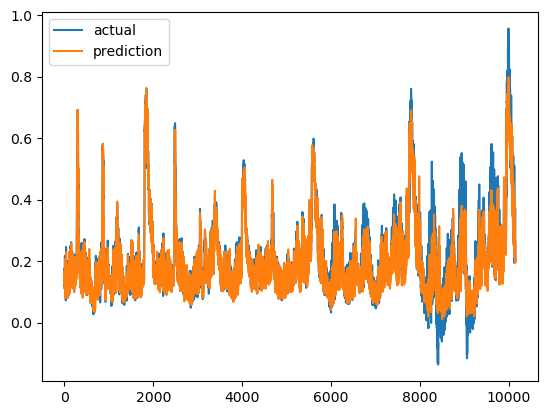

{'mae': 0    0.022595
dtype: float64, 'mape': 0    11.943651
dtype: float64, 'rmse': 0    0.035767
dtype: float64}


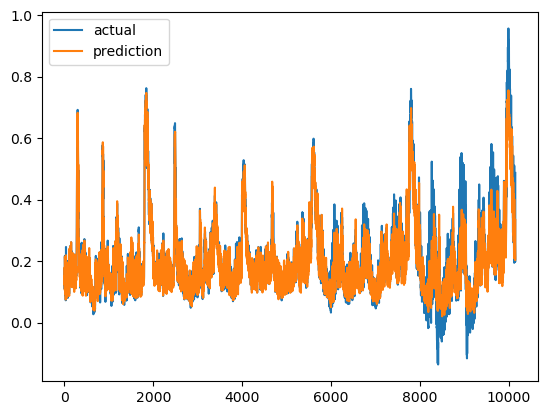

{'mae': 0    0.024803
dtype: float64, 'mape': 0    13.909781
dtype: float64, 'rmse': 0    0.038801
dtype: float64}


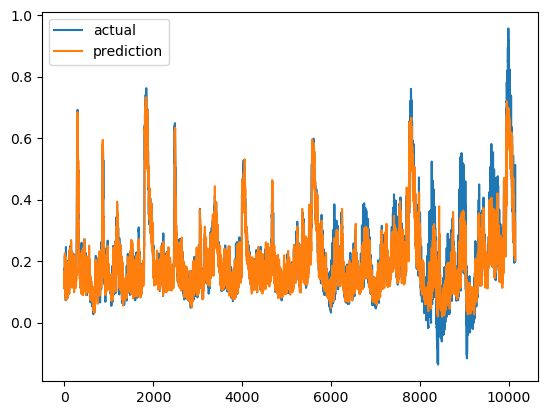

In [12]:
my_model.fit_Bi_Seq2("seasonal", is_final = 1)

## residual fitting

Epoch 1/1000
1271/1271 [==============================] - 39s 30ms/step - loss: 0.0024 - val_loss: 0.0035
Epoch 2/1000
1271/1271 [==============================] - 37s 30ms/step - loss: 0.0014 - val_loss: 0.0015
Epoch 3/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 5.5936e-04 - val_loss: 0.0013
Epoch 4/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 4.6787e-04 - val_loss: 0.0012
Epoch 5/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 4.1661e-04 - val_loss: 0.0014
Epoch 6/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 3.5153e-04 - val_loss: 0.0012
Epoch 7/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 3.2099e-04 - val_loss: 0.0011
Epoch 8/1000
1271/1271 [==============================] - 37s 29ms/step - loss: 3.3038e-04 - val_loss: 9.9613e-04
Epoch 9/1000
1271/1271 [==============================] - 38s 30ms/step - loss: 2.9339e-04 - val_loss: 8.3994e-04
Epoch 10/1

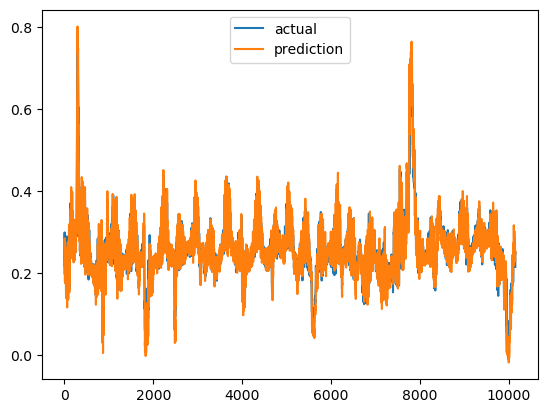

{'mae': 0    0.012851
dtype: float64, 'mape': 0    5.977901
dtype: float64, 'rmse': 0    0.018926
dtype: float64}


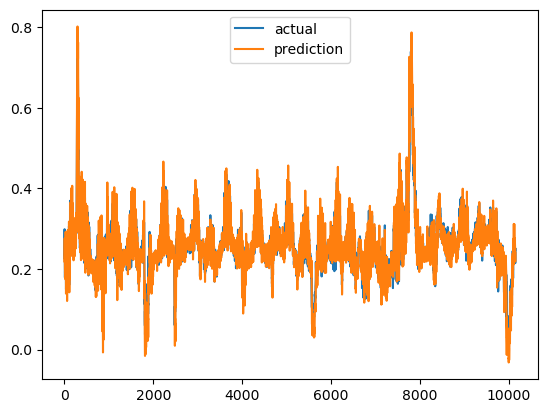

{'mae': 0    0.013775
dtype: float64, 'mape': 0    6.680799
dtype: float64, 'rmse': 0    0.019916
dtype: float64}


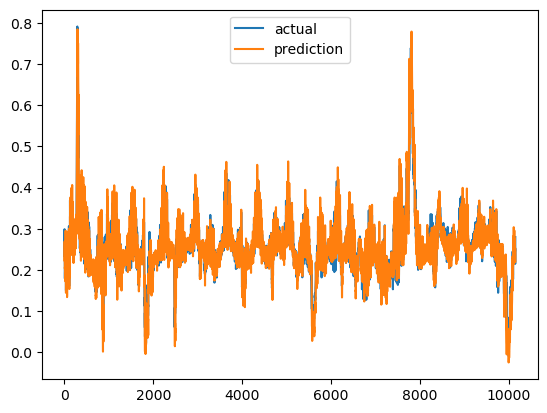

In [14]:
my_model.fit_Bi_Seq2("residual", is_final = 1)

## Eval Testing

In [18]:
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

In [13]:
pree = Preprocessing_minmax("1018680")
pree.merging()
pree.do_blocking()
pree.do_minmax_and_pca()
full_data = pree.pca_full_data
full_data_test = pree.pca_full_data_test
full_data_final_test = pree.pca_full_data_final_test

415


In [15]:
mmmy_model = predict_model(full_data, "1018680")

In [33]:
model = load(f'trend_model.joblib')
        
given_data = full_data_test[0]
        
X_test = given_data[0][0]
y_test = given_data[0][1]
        
df_test = pd.merge(y_test, X_test, left_index=True, right_index=True, how='inner')
        
pred = []
lag = 15 
step = 3

print(df_test)
        
for i in range(0, len(df_test)-lag):
    lagged_values = df_test.values[i-lag: i]
    print(lagged_values)
    forecast = pd.DataFrame(model.forecast(y = lagged_values, steps = step), columns=df_test.columns)
    pred.append([[forecast[0][0]], [forecast[0][1]], [forecast[0][2]]])

             0      pca1      pca2      pca3      pca4      pca5      pca6  \
0     0.047343  0.717644  0.165259  0.081086 -0.110125  0.157557 -0.029883   
1     0.047339  0.717515  0.165490  0.080997 -0.110052  0.157623 -0.029868   
2     0.047334  0.717385  0.165720  0.080908 -0.109979  0.157688 -0.029854   
3     0.047330  0.717254  0.165951  0.080819 -0.109906  0.157754 -0.029839   
4     0.047325  0.717124  0.166181  0.080729 -0.109833  0.157820 -0.029825   
...        ...       ...       ...       ...       ...       ...       ...   
6354  0.023394 -0.324258 -0.929208 -0.620484  0.129171  0.354194 -0.132180   
6355  0.023070 -0.323796 -0.929687 -0.620959  0.129211  0.354401 -0.132202   
6356  0.022746 -0.323334 -0.930166 -0.621433  0.129251  0.354608 -0.132224   
6357  0.022422 -0.322872 -0.930645 -0.621908  0.129291  0.354815 -0.132246   
6358  0.022098 -0.322410 -0.931124 -0.622382  0.129331  0.355022 -0.132267   

          pca7      pca8      pca9     pca10     pca11  
0    -

ValueError: y must by have at least order (15) observations. Got 0.

In [19]:
#trend_eval = mmmy_model.eval_VAR_model(full_data_test, "trend")
seasonal_eval = mmmy_model.eval_Bi_Seq2(full_data_test, "seasonal")
resid_eval = mmmy_model.eval_Bi_Seq2(full_data_test, "residual")

2023-10-22 18:19:50.624775: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-22 18:19:50.638133: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-22 18:19:50.638178: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-22 18:19:50.640154: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-22 18:19:50.642487: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-22 18:19:50.642835: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

UnknownError:    Fail to find the dnn implementation.
	 [[{{node CudnnRNN}}]]
	 [[sequential_4/bidirectional_8/forward_lstm_16/PartitionedCall]] [Op:__inference_predict_function_6159]

Function call stack:
predict_function -> predict_function -> predict_function


In [27]:
full_data_test[0][0][1]

,0
0,0.047343
1,0.047339
2,0.047334
3,0.047330
4,0.047325
...,...
6354,0.023394
6355,0.023070
6356,0.022746
6357,0.022422


In [61]:
my_model_temp = predict_model(full_data)

In [62]:
my_model.fit_VAR_model("trend", is_final = 0)

[[ 0.00733591  1.55508401  0.09473601  0.08292917 -0.16285405 -0.23190803
   0.10125983  0.05776651 -0.02661491  0.00684568  0.00448666  0.00712387
          nan         nan         nan         nan         nan         nan
          nan         nan         nan         nan         nan         nan
          nan]
 [ 0.00740422  1.5544496   0.09476193  0.08288442 -0.16280347 -0.23179978
   0.10116372  0.05770576 -0.02659015  0.00684268  0.00448558  0.00712136
          nan         nan         nan         nan         nan         nan
          nan         nan         nan         nan         nan         nan
          nan]
 [ 0.00747255  1.55381518  0.09478783  0.08283965 -0.1627529  -0.23169154
   0.1010676   0.05764501 -0.0265654   0.00683968  0.00448451  0.00711885
          nan         nan         nan         nan         nan         nan
          nan         nan         nan         nan         nan         nan
          nan]
 [ 0.00754089  1.55318076  0.09481374  0.08279486 -0.16270234 -0.23

ValueError: shapes (12,12) and (25,) not aligned: 12 (dim 1) != 25 (dim 0)

In [11]:
full_data_final_test

[[[           pca1      pca2      pca3      pca4      pca5      pca6      pca7  \
   0      1.555084  0.094736  0.082929 -0.162854 -0.231908  0.101260  0.057767   
   1      1.554450  0.094762  0.082884 -0.162803 -0.231800  0.101164  0.057706   
   2      1.553815  0.094788  0.082840 -0.162753 -0.231692  0.101068  0.057645   
   3      1.553181  0.094814  0.082795 -0.162702 -0.231583  0.100971  0.057584   
   4      1.552546  0.094840  0.082750 -0.162652 -0.231475  0.100875  0.057524   
   ...         ...       ...       ...       ...       ...       ...       ...   
   50870 -0.322872 -0.930645 -0.621908  0.129291  0.354815 -0.132246  0.062251   
   50871 -0.322410 -0.931124 -0.622382  0.129331  0.355022 -0.132267  0.062297   
   50872 -0.321948 -0.931602 -0.622857  0.129371  0.355229 -0.132289  0.062342   
   50873 -0.321486 -0.932081 -0.623331  0.129411  0.355436 -0.132311  0.062388   
   50874 -0.321023 -0.932560 -0.623806  0.129452  0.355643 -0.132333  0.062433   
   
            

# 발표 때 하이퍼 파라미터 어케 조정했는지 써야 되니까 돌리는 코드

In [10]:
class lstm_model:
    
    def __init__(self, df):
        self.type_dict = {'trend': 0, 'seasonal': 1, 'residual': 2}
        
        self.dataset = df
        
        self.trend_model = 0
        
        self.scaler_X = []
        self.scaler_y = []
        self.seasonal_model = 0
        
        self.df = []
        
    ###################         

    def make_dataset(self, X_df, y_df, time_step = 8, y_step = 3):
        new_X_df = []
        new_y_df = []
        X_df = pd.concat([X_df, y_df], axis=1)
        for i in range(len(X_df) - time_step - y_step + 1):
            new_X_df.append(np.array(X_df.iloc[i:i + time_step]))
            new_y_df.append(np.array(y_df.iloc[i + time_step: i + time_step + y_step]))
        return np.array(new_X_df), np.array(new_y_df)
    
    
    def calculate_metrics(self, true, pred):
        true = pd.DataFrame(true)
        pred = pd.DataFrame(pred)
        mae = (true - pred).abs().mean()
        mape = (true - pred).abs().div(true).mean() * 100
        rmse = np.sqrt(((true - pred) ** 2).mean())
        return {
            "mae": mae,
            "mape": mape,
            "rmse": rmse,
        }
    
    def Bi_Seq2_model(self, feature_num, time_step, y_step):

        model = keras.Sequential()
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(128, activation = 'tanh', input_shape = (time_step, feature_num), return_sequences = True, kernel_initializer='he_normal')))
        model.add(keras.layers.Bidirectional(keras.layers.LSTM(64, activation = 'tanh')))
        model.add(keras.layers.RepeatVector(y_step))
        model.add(keras.layers.LSTM(64, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.LSTM(128, activation = 'tanh', return_sequences = True))
        model.add(keras.layers.TimeDistributed(keras.layers.Dense(1)))
        #model.compile(optimizer = 'nadam', loss = 'mse')
        #model.summary()

        return model
    
    def Bi_Seq2_fit(self, model, X_train, y_train, X_valid, y_valid, time_step = 8, patience = 50, epochs = 1000):

        model.compile(loss='mean_squared_error', optimizer = 'nadam')
        early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience = patience)

        history = model.fit(X_train, y_train, 
                            epochs = epochs,
                            validation_data = (X_valid, y_valid), 
                            callbacks = [early_stop],
                            shuffle = False)
        return history
    
    def fit_Bi_Seq2(self, my_type, is_final, time_step = 30, y_step = 3, patience = 100, epochs = 1000):
        
        self.scaled_data = self.dataset[self.type_dict[my_type]]
        
        pred = []
        
        with tf.device('/device:GPU:0'):
            least_rmse = 1000
            #best_time_step = 20
            for i in range(len(self.dataset[0])):
                (lstm_X_train, lstm_y_train) = self.make_dataset(self.scaled_data[i][0], self.scaled_data[i][1], time_step)
                (lstm_X_valid, lstm_y_valid) = self.make_dataset(self.scaled_data[i][2], self.scaled_data[i][3], time_step)

                model = self.Bi_Seq2_model(len(lstm_X_train[0][0]), time_step, y_step)

                history = self.Bi_Seq2_fit(model, lstm_X_train, lstm_y_train, lstm_X_valid, lstm_y_valid, time_step, patience, epochs)

                pred_temp = model.predict(lstm_X_valid)

                rmse = 0

                for j in range(y_step):
                    pred.append(pred_temp)
                    mat = self.calculate_metrics(lstm_y_valid[:, j], pred_temp[:, j])
                    print(mat)
                    rmse = rmse + mat['rmse'][0]

                    plt.plot(lstm_y_valid[:, j], label = 'actual')
                    plt.plot(pred_temp[:, j], label = 'prediction')
                        # print(self.calculate_metrics(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j])))
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], lstm_y_valid[:, j]), label = 'actual')
                        # plt.plot(self.inverse_min_max_scaling(self.scaler_y[i], pred_temp[:, j]), label = 'prediction')
                    plt.legend()
                    plt.show()

                rmse = rmse / y_step

                if rmse < least_rmse:
                    least_rmse = rmse
                    best_time_step = time_step
                    best_model = model
        
        if is_final == 1:
            best_model.save(f'{my_type}_model_final.h5')
        else:
            best_model.save(f'{my_type}_model.h5')
    
    def eval_Bi_Seq2(self, df, my_type): # 모델 평가를 위한 예측값을 도출하는 함수
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_model.h5')
        
        new_df = df[self.type_dict[my_type]]
        (lstm_X_test, lstm_y_test) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)
        
        pred = model.predict(lstm_X_test)
        
        return pred
        
    def pred_Bi_Seq2(self, my_type): # 실제 예측을 위한 함수
        
        df = self.dataset
        
        time_step = 30
        
        model = tf.keras.models.load_model(f'{my_type}_model_final.h5')
        new_df = df[1]
        lstm_X_test = pd.concat([new_df[0][0].iloc[-time_step:], new_df[0][1].iloc[-time_step:]], axis=1)
        (lstm_X_temp, lstm_y_temp) = self.make_dataset(new_df[0][0], new_df[0][1], time_step)

        lstm_X_test = np.array([lstm_X_test])

        return model.predict(lstm_X_test)

In [13]:
lstm_model = lstm_model(full_data)

Epoch 1/1000
159/159 [==============================] - 5s 35ms/step - loss: 0.0067 - val_loss: 0.0039
Epoch 2/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0039 - val_loss: 0.0031
Epoch 3/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 4/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0024 - val_loss: 0.0023
Epoch 5/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 6/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0020 - val_loss: 0.0018
Epoch 7/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 8/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 9/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 10/1000
159/159 [==============================] - 4s 28ms/step - l

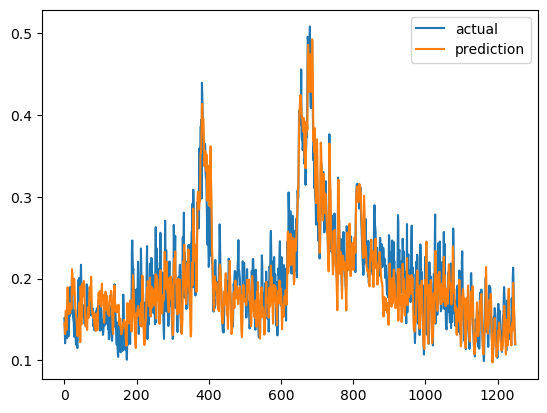

{'mae': 0    0.020627
dtype: float64, 'mape': 0    10.612654
dtype: float64, 'rmse': 0    0.026422
dtype: float64}


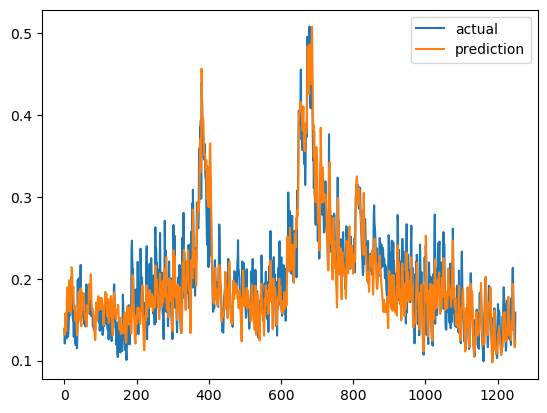

{'mae': 0    0.020328
dtype: float64, 'mape': 0    10.480611
dtype: float64, 'rmse': 0    0.026105
dtype: float64}


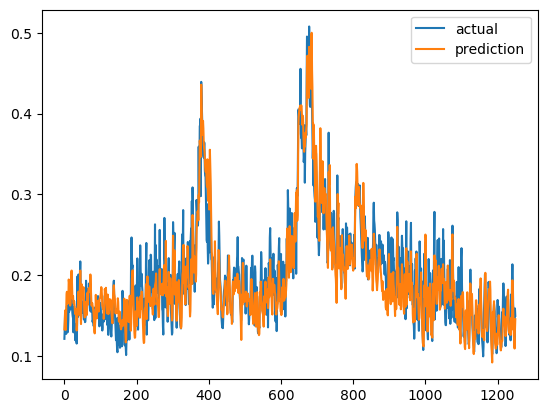

Epoch 1/1000
159/159 [==============================] - 5s 34ms/step - loss: 0.0039 - val_loss: 0.0023
Epoch 2/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0021 - val_loss: 0.0016
Epoch 3/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 4/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 5/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 6/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 7/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 8/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 9/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 10/1000
159/159 [==============================] - 4s 27ms/step - l

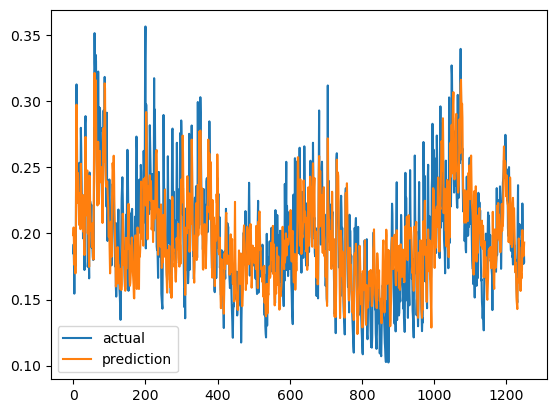

{'mae': 0    0.021654
dtype: float64, 'mape': 0    11.356989
dtype: float64, 'rmse': 0    0.028146
dtype: float64}


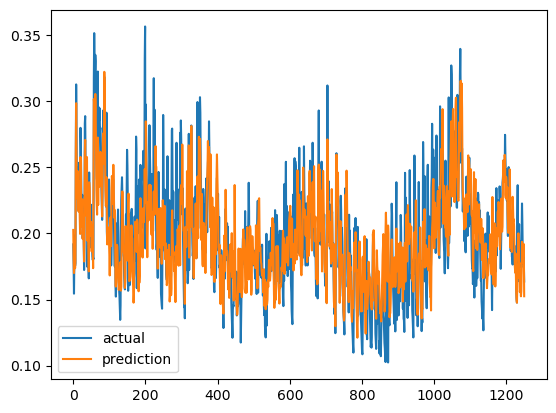

{'mae': 0    0.022466
dtype: float64, 'mape': 0    11.831976
dtype: float64, 'rmse': 0    0.029046
dtype: float64}


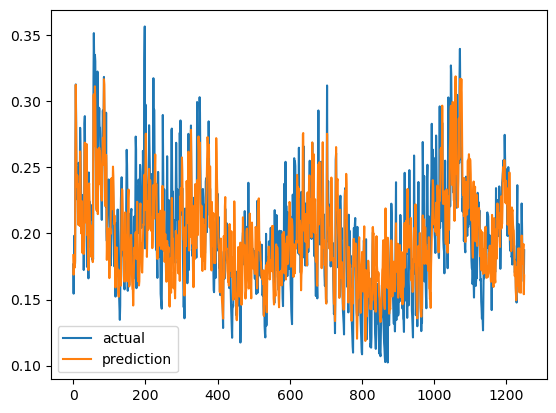

Epoch 1/1000
159/159 [==============================] - 5s 33ms/step - loss: 0.0032 - val_loss: 0.0061
Epoch 2/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0016 - val_loss: 0.0057
Epoch 3/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0015 - val_loss: 0.0052
Epoch 4/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0015 - val_loss: 0.0046
Epoch 5/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0014 - val_loss: 0.0041
Epoch 6/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0013 - val_loss: 0.0038
Epoch 7/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0012 - val_loss: 0.0034
Epoch 8/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0011 - val_loss: 0.0031
Epoch 9/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0011 - val_loss: 0.0031
Epoch 10/1000
159/159 [==============================] - 4s 27ms/step - l

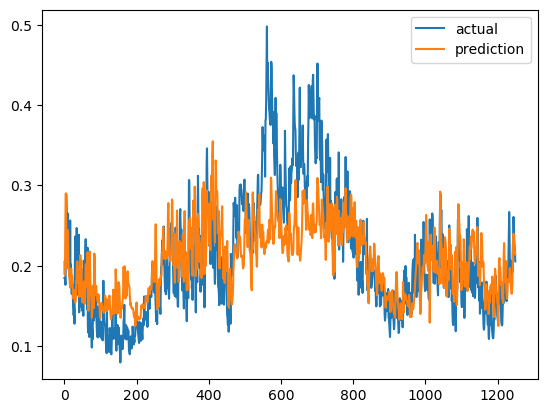

{'mae': 0    0.037327
dtype: float64, 'mape': 0    18.019116
dtype: float64, 'rmse': 0    0.051059
dtype: float64}


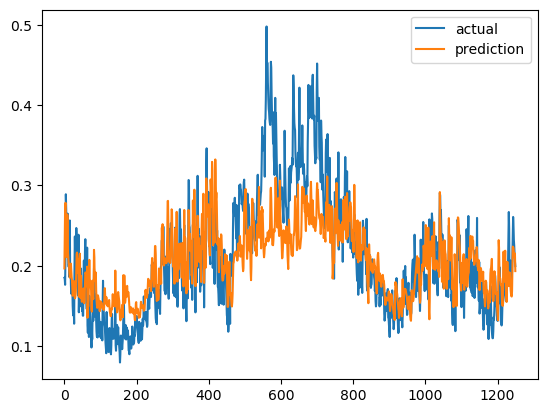

{'mae': 0    0.036274
dtype: float64, 'mape': 0    17.848516
dtype: float64, 'rmse': 0    0.048741
dtype: float64}


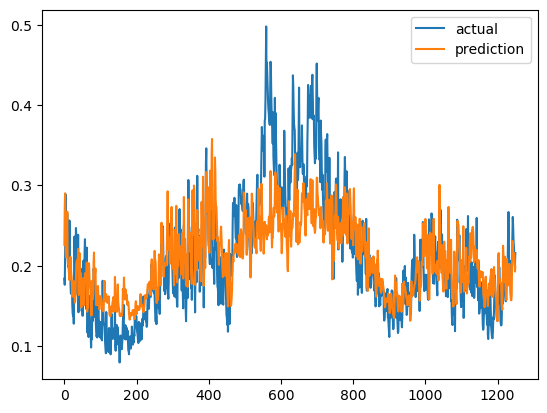

Epoch 1/1000
159/159 [==============================] - 5s 34ms/step - loss: 0.0099 - val_loss: 0.0264
Epoch 2/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0049 - val_loss: 0.0134
Epoch 3/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0033 - val_loss: 0.0076
Epoch 4/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0026 - val_loss: 0.0051
Epoch 5/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0022 - val_loss: 0.0036
Epoch 6/1000
159/159 [==============================] - 4s 28ms/step - loss: 0.0018 - val_loss: 0.0034
Epoch 7/1000
159/159 [==============================] - 4s 28ms/step - loss: 0.0016 - val_loss: 0.0031
Epoch 8/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 9/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0014 - val_loss: 0.0028
Epoch 10/1000
159/159 [==============================] - 4s 27ms/step - l

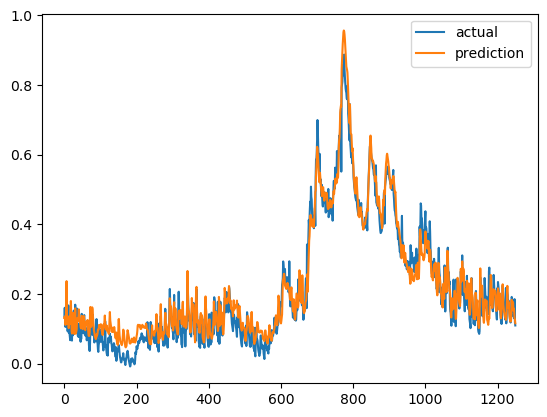

{'mae': 0    0.031352
dtype: float64, 'mape': 0    32.452004
dtype: float64, 'rmse': 0    0.039523
dtype: float64}


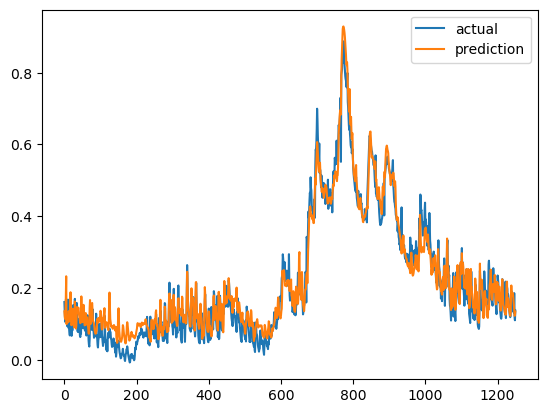

{'mae': 0    0.032959
dtype: float64, 'mape': 0    36.060039
dtype: float64, 'rmse': 0    0.041078
dtype: float64}


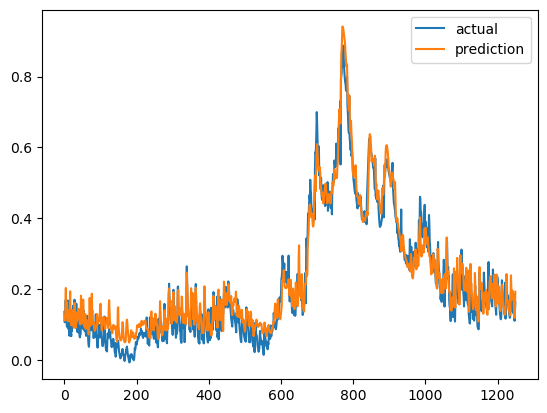

Epoch 1/1000
159/159 [==============================] - 5s 34ms/step - loss: 0.0032 - val_loss: 0.0020
Epoch 2/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 4/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 5/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 6/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0013 - val_loss: 0.0012
Epoch 7/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 8/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 9/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0010 - val_loss: 0.0011
Epoch 10/1000
159/159 [==============================] - 4s 28ms/step - l

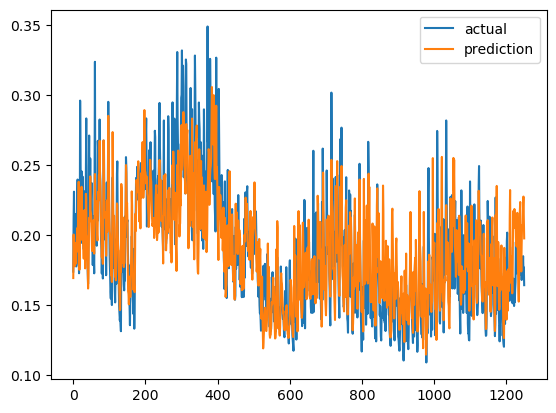

{'mae': 0    0.019875
dtype: float64, 'mape': 0    10.658491
dtype: float64, 'rmse': 0    0.026552
dtype: float64}


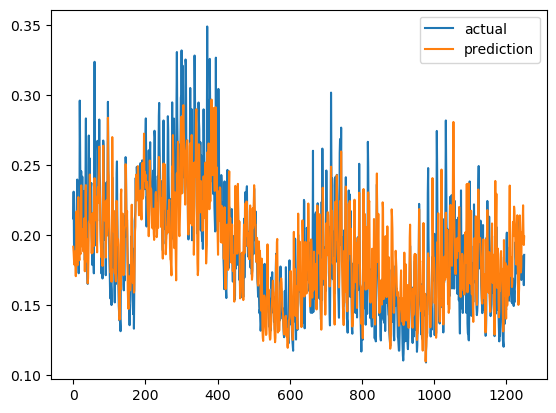

{'mae': 0    0.020476
dtype: float64, 'mape': 0    10.986492
dtype: float64, 'rmse': 0    0.027352
dtype: float64}


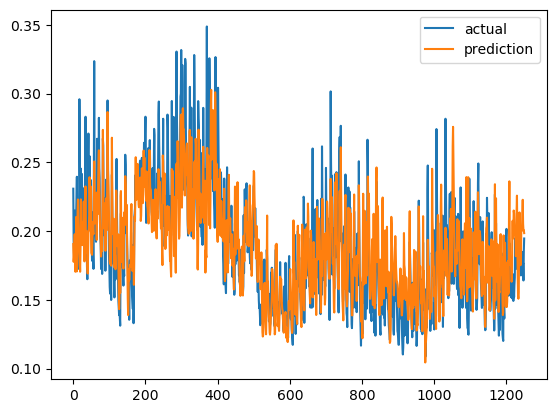

Epoch 1/1000
159/159 [==============================] - 5s 34ms/step - loss: 0.0032 - val_loss: 0.0053
Epoch 2/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0016 - val_loss: 0.0044
Epoch 3/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0015 - val_loss: 0.0039
Epoch 4/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0014 - val_loss: 0.0033
Epoch 5/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 6/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0012 - val_loss: 0.0026
Epoch 7/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0010 - val_loss: 0.0023
Epoch 8/1000
159/159 [==============================] - 4s 26ms/step - loss: 9.6568e-04 - val_loss: 0.0020
Epoch 9/1000
159/159 [==============================] - 4s 26ms/step - loss: 9.0343e-04 - val_loss: 0.0018
Epoch 10/1000
159/159 [==============================] - 4s 27ms/

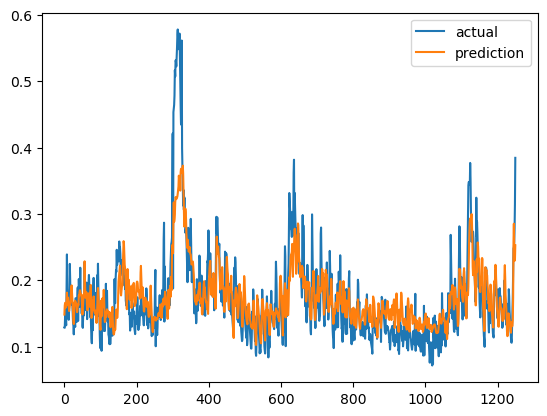

{'mae': 0    0.028289
dtype: float64, 'mape': 0    16.581928
dtype: float64, 'rmse': 0    0.040638
dtype: float64}


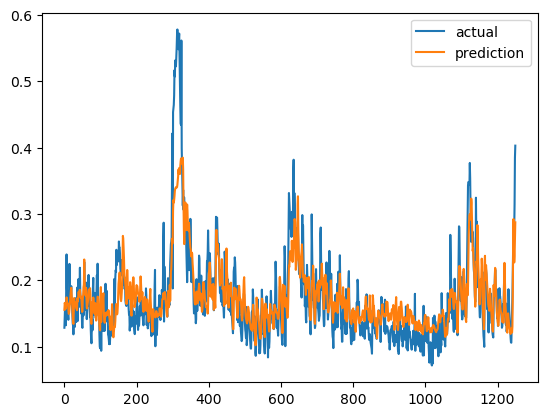

{'mae': 0    0.02777
dtype: float64, 'mape': 0    16.202066
dtype: float64, 'rmse': 0    0.040052
dtype: float64}


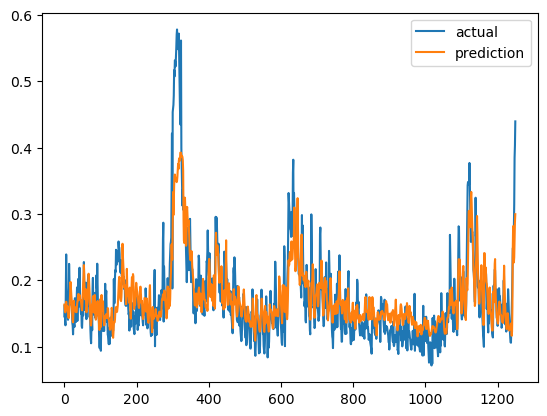

Epoch 1/1000
159/159 [==============================] - 5s 33ms/step - loss: 0.0160 - val_loss: 0.0094
Epoch 2/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0054 - val_loss: 0.0024
Epoch 3/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0035 - val_loss: 0.0018
Epoch 4/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0024 - val_loss: 0.0015
Epoch 5/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0019 - val_loss: 0.0014
Epoch 6/1000
159/159 [==============================] - 4s 28ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 7/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 8/1000
159/159 [==============================] - 4s 26ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 9/1000
159/159 [==============================] - 4s 27ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 10/1000
159/159 [==============================] - 4s 27ms/step - l

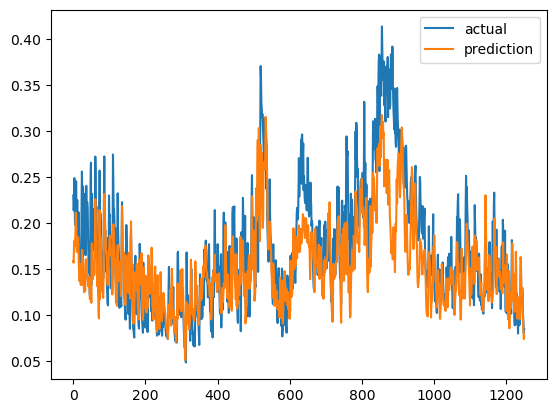

{'mae': 0    0.030371
dtype: float64, 'mape': 0    16.76766
dtype: float64, 'rmse': 0    0.042319
dtype: float64}


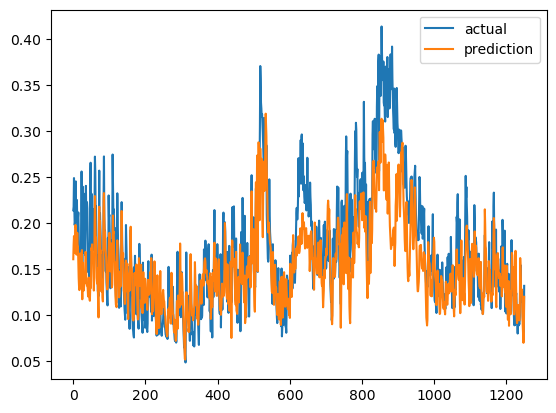

{'mae': 0    0.030527
dtype: float64, 'mape': 0    16.754823
dtype: float64, 'rmse': 0    0.042461
dtype: float64}


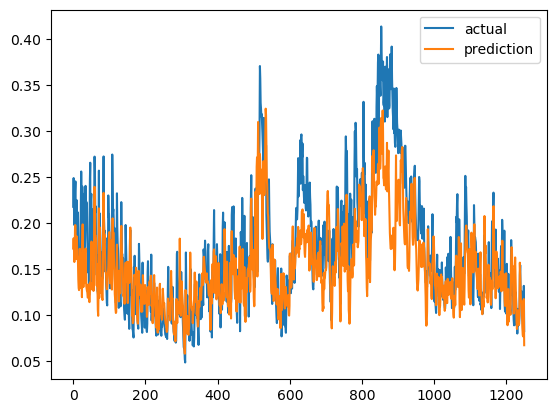

Epoch 1/1000
158/158 [==============================] - 6s 38ms/step - loss: 0.0071 - val_loss: 0.0037
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 3/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 4/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0022 - val_loss: 0.0021
Epoch 5/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 6/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 7/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 8/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 9/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0015 - val_loss: 0.0013
Epoch 10/1000
158/158 [==============================] - 5s 30ms/step - l

In [ ]:
time_step_list = [20, 30] # 40은 지금 하면 중간에 멈출 듯 ㅇㅅㅇ 나중에 하자
for time_step in time_step_list:
    lstm_model.fit_Bi_Seq2(my_type = "seasonal", time_step = time_step, is_final = 0)

2023-10-21 11:19:37.837533: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-21 11:19:37.857154: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-21 11:19:37.857220: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-21 11:19:37.860323: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-21 11:19:37.863630: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-21 11:19:37.864647: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/1000


2023-10-21 11:19:45.962911: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-21 11:19:46.307705: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7


158/158 [==============================] - 6s 40ms/step - loss: 0.0070 - val_loss: 0.0038
Epoch 2/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0035 - val_loss: 0.0028
Epoch 3/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0027 - val_loss: 0.0023
Epoch 4/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0022 - val_loss: 0.0020
Epoch 5/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0021 - val_loss: 0.0019
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 7/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0015 - val_loss: 0.0014
Epoch 10/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0014 -

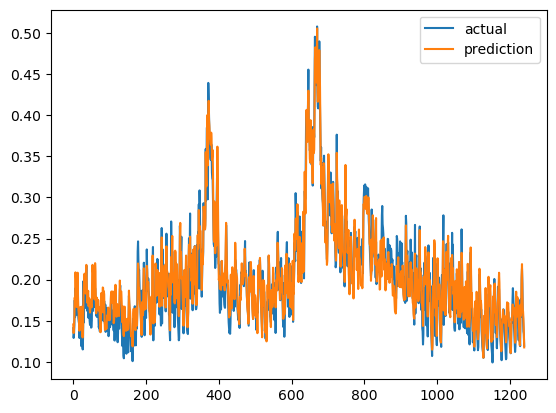

{'mae': 0    0.013888
dtype: float64, 'mape': 0    7.411289
dtype: float64, 'rmse': 0    0.017726
dtype: float64}


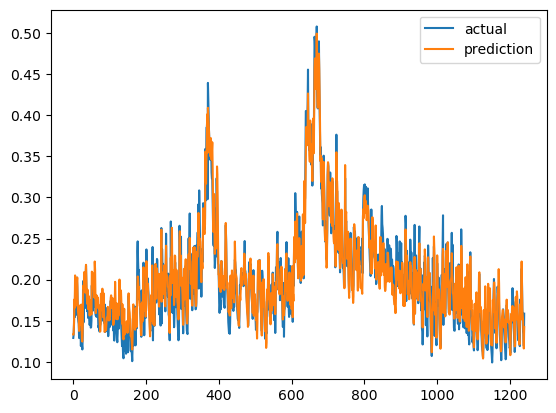

{'mae': 0    0.014789
dtype: float64, 'mape': 0    7.917675
dtype: float64, 'rmse': 0    0.018875
dtype: float64}


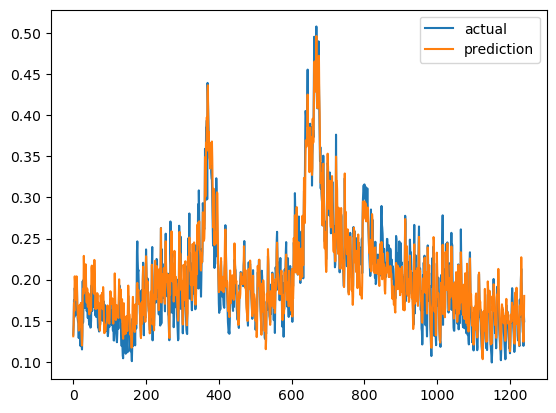

Epoch 1/1000
158/158 [==============================] - 6s 37ms/step - loss: 0.0034 - val_loss: 0.0019
Epoch 2/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0023 - val_loss: 0.0018
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0020 - val_loss: 0.0014
Epoch 4/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 6/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 7/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0011 - val_loss: 0.0011
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 9.7300e-04 - val_loss: 9.1315e-04
Epoch 9/1000
158/158 [==============================] - 5s 30ms/step - loss: 8.0822e-04 - val_loss: 8.2798e-04
Epoch 10/1000
158/158 [==============================] - 

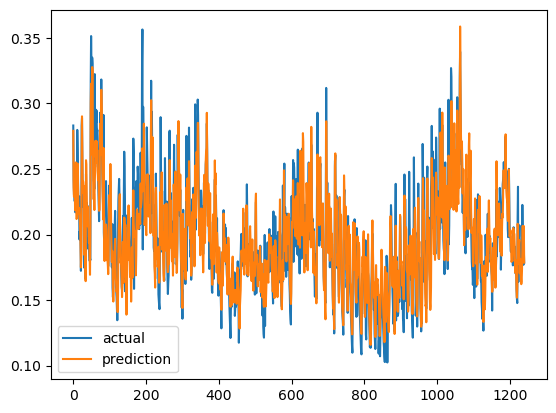

{'mae': 0    0.015083
dtype: float64, 'mape': 0    7.83854
dtype: float64, 'rmse': 0    0.019997
dtype: float64}


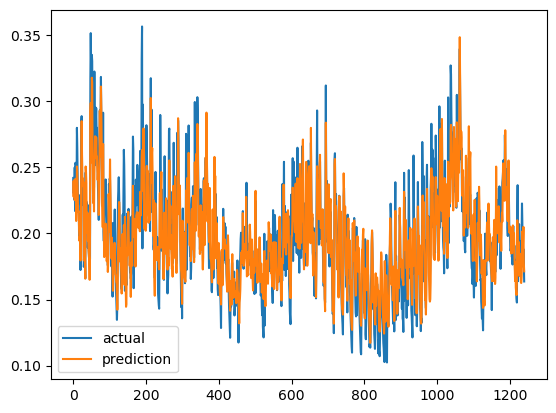

{'mae': 0    0.015559
dtype: float64, 'mape': 0    8.030235
dtype: float64, 'rmse': 0    0.020557
dtype: float64}


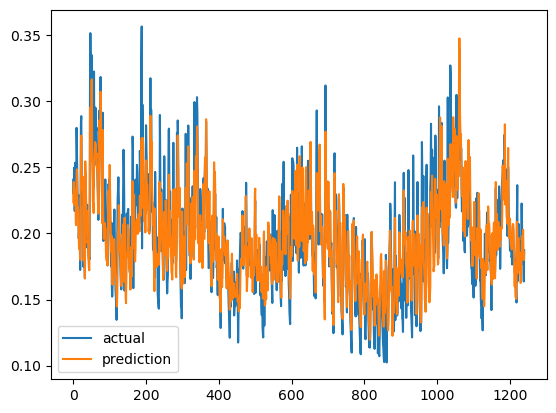

Epoch 1/1000
158/158 [==============================] - 6s 37ms/step - loss: 0.0031 - val_loss: 0.0055
Epoch 2/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0017 - val_loss: 0.0054
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0016 - val_loss: 0.0052
Epoch 4/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0015 - val_loss: 0.0046
Epoch 5/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0014 - val_loss: 0.0042
Epoch 6/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0013 - val_loss: 0.0040
Epoch 7/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0012 - val_loss: 0.0037
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0011 - val_loss: 0.0035
Epoch 9/1000
158/158 [==============================] - 5s 30ms/step - loss: 9.0629e-04 - val_loss: 0.0030
Epoch 10/1000
158/158 [==============================] - 5s 30ms/step

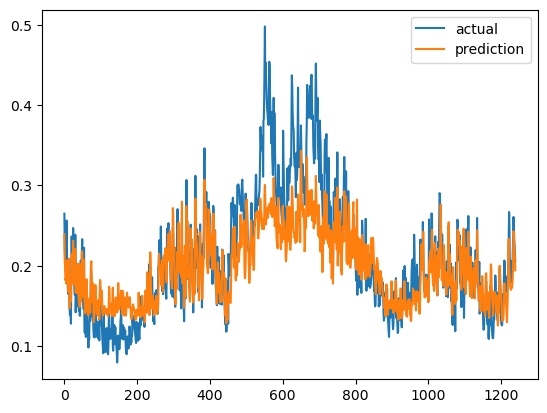

{'mae': 0    0.029481
dtype: float64, 'mape': 0    13.614814
dtype: float64, 'rmse': 0    0.042332
dtype: float64}


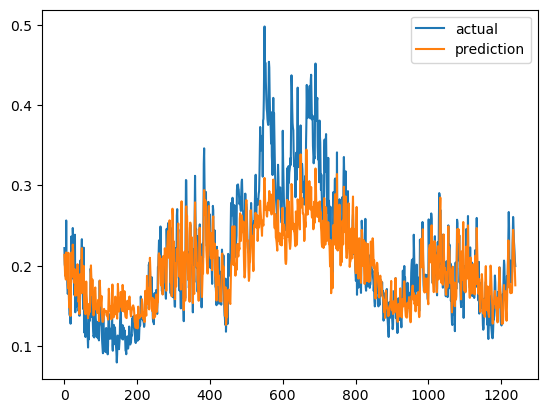

{'mae': 0    0.030756
dtype: float64, 'mape': 0    14.327662
dtype: float64, 'rmse': 0    0.043622
dtype: float64}


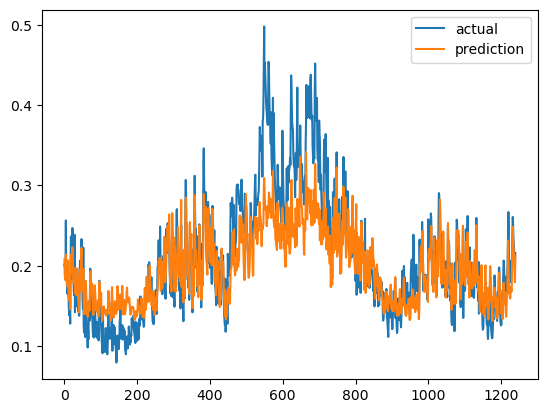

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.0108 - val_loss: 0.0325
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0060 - val_loss: 0.0135
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0034 - val_loss: 0.0058
Epoch 4/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0026 - val_loss: 0.0046
Epoch 5/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 6/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0018 - val_loss: 0.0051
Epoch 7/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0017 - val_loss: 0.0046
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0014 - val_loss: 0.0039
Epoch 9/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 10/1000
158/158 [==============================] - 5s 30ms/step - l

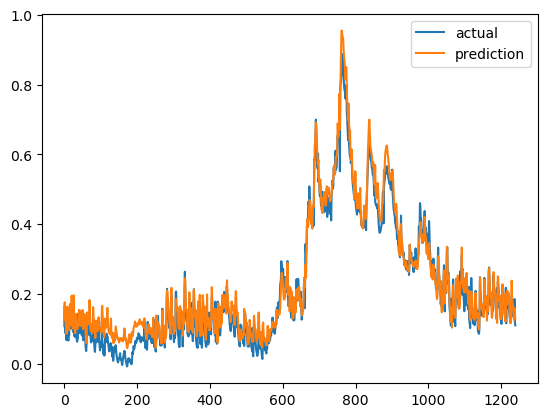

{'mae': 0    0.027627
dtype: float64, 'mape': 0    30.053733
dtype: float64, 'rmse': 0    0.03477
dtype: float64}


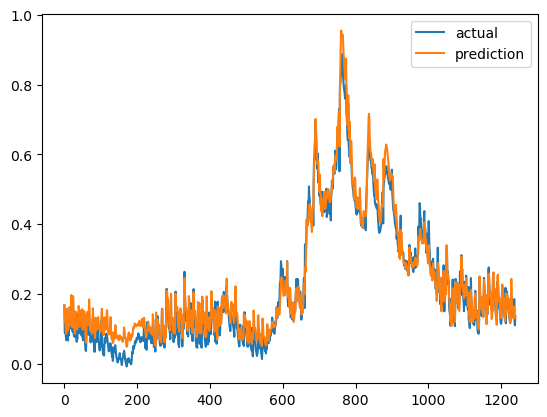

{'mae': 0    0.029513
dtype: float64, 'mape': 0    30.567779
dtype: float64, 'rmse': 0    0.037383
dtype: float64}


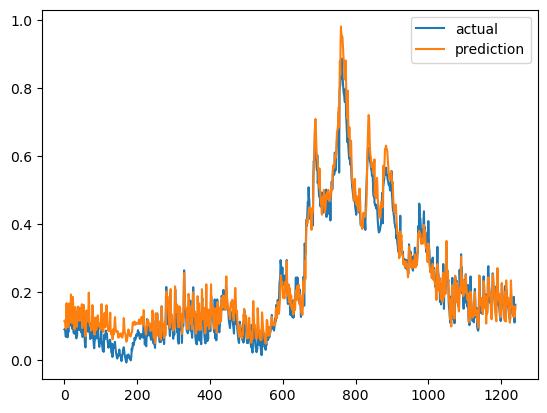

Epoch 1/1000
158/158 [==============================] - 6s 38ms/step - loss: 0.0032 - val_loss: 0.0021
Epoch 2/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 4/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0017 - val_loss: 0.0015
Epoch 5/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 6/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 7/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0011 - val_loss: 0.0010
Epoch 9/1000
158/158 [==============================] - 5s 30ms/step - loss: 8.7981e-04 - val_loss: 9.1376e-04
Epoch 10/1000
158/158 [==============================] - 5s 30ms/

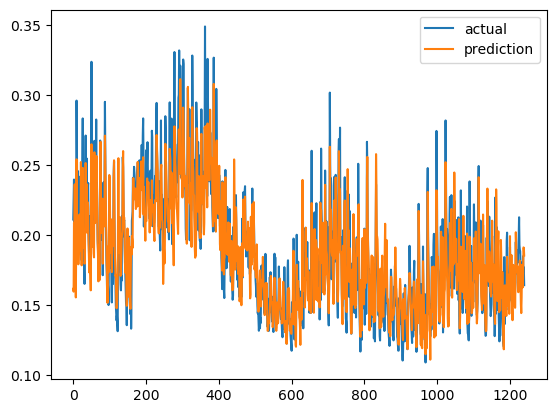

{'mae': 0    0.013628
dtype: float64, 'mape': 0    7.257001
dtype: float64, 'rmse': 0    0.018075
dtype: float64}


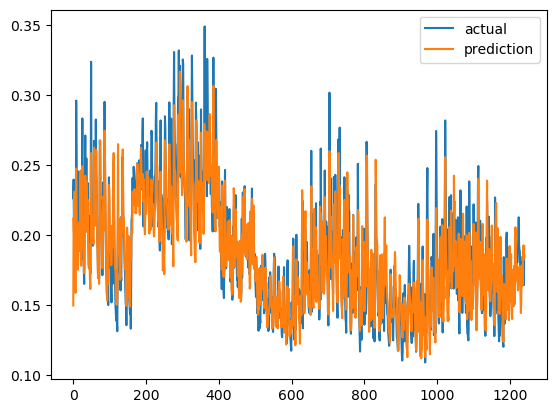

{'mae': 0    0.014129
dtype: float64, 'mape': 0    7.476693
dtype: float64, 'rmse': 0    0.018998
dtype: float64}


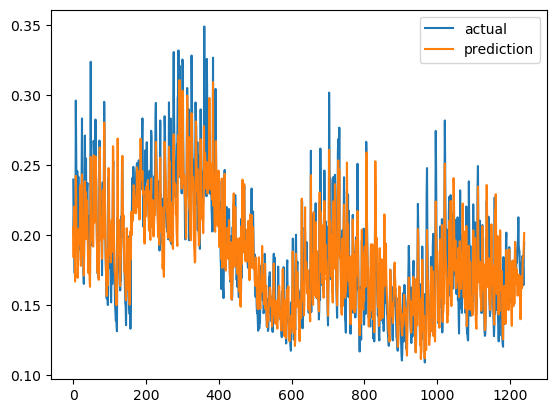

Epoch 1/1000
158/158 [==============================] - 6s 38ms/step - loss: 0.0029 - val_loss: 0.0052
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0016 - val_loss: 0.0045
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0016 - val_loss: 0.0040
Epoch 4/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0015 - val_loss: 0.0037
Epoch 5/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0013 - val_loss: 0.0032
Epoch 6/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 7/1000
158/158 [==============================] - 5s 29ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 9.5719e-04 - val_loss: 0.0023
Epoch 9/1000
158/158 [==============================] - 5s 31ms/step - loss: 8.5506e-04 - val_loss: 0.0016
Epoch 10/1000
158/158 [==============================] - 5s 30ms/

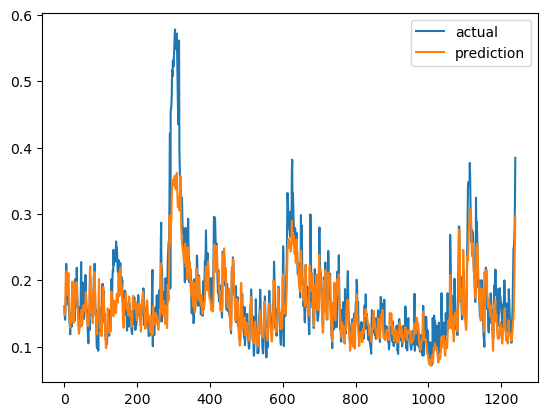

{'mae': 0    0.022717
dtype: float64, 'mape': 0    11.850106
dtype: float64, 'rmse': 0    0.038392
dtype: float64}


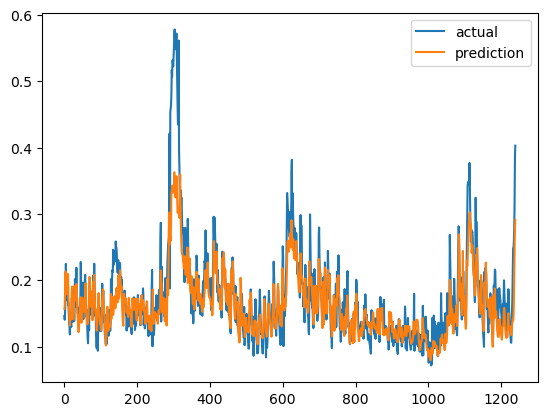

{'mae': 0    0.023396
dtype: float64, 'mape': 0    12.201392
dtype: float64, 'rmse': 0    0.038937
dtype: float64}


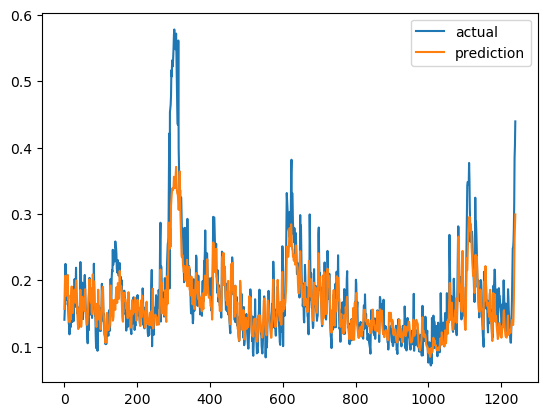

Epoch 1/1000
158/158 [==============================] - 6s 37ms/step - loss: 0.0168 - val_loss: 0.0106
Epoch 2/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0055 - val_loss: 0.0028
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0027 - val_loss: 0.0018
Epoch 4/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0022 - val_loss: 0.0017
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0024 - val_loss: 0.0013
Epoch 6/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0018 - val_loss: 0.0017
Epoch 7/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 8/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0023 - val_loss: 0.0013
Epoch 9/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0019 - val_loss: 0.0014
Epoch 10/1000
158/158 [==============================] - 5s 30ms/step - l

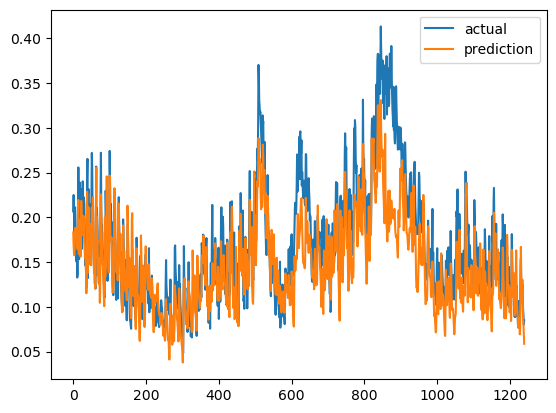

{'mae': 0    0.033027
dtype: float64, 'mape': 0    18.066637
dtype: float64, 'rmse': 0    0.044249
dtype: float64}


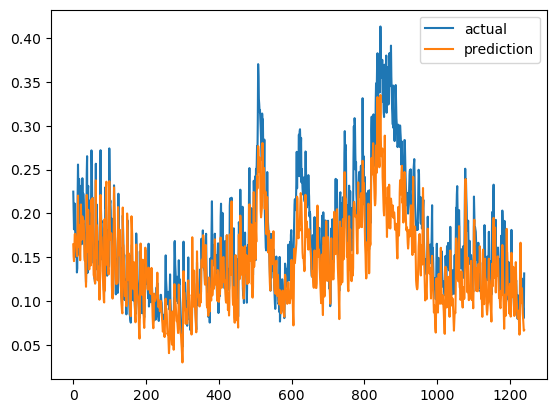

{'mae': 0    0.031798
dtype: float64, 'mape': 0    17.12243
dtype: float64, 'rmse': 0    0.043325
dtype: float64}


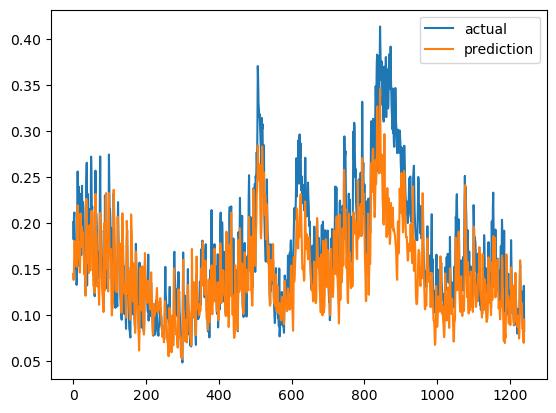

In [14]:
time_step_list = [30] # 40은 지금 하면 중간에 멈출 듯 ㅇㅅㅇ 나중에 하자
for time_step in time_step_list:
    lstm_model.fit_Bi_Seq2(my_type = "seasonal", time_step = time_step, is_final = 0)

Epoch 1/1000
158/158 [==============================] - 6s 40ms/step - loss: 0.0073 - val_loss: 0.0040
Epoch 2/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 4/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 5/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0019 - val_loss: 0.0015
Epoch 7/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0017 - val_loss: 0.0014
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0015
Epoch 10/1000
158/158 [==============================] - 5s 32ms/step - l

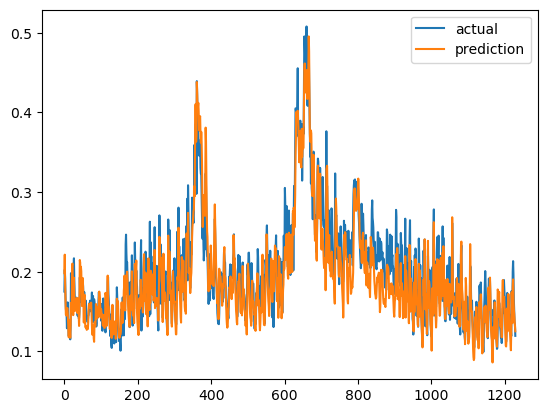

{'mae': 0    0.020918
dtype: float64, 'mape': 0    10.467214
dtype: float64, 'rmse': 0    0.026573
dtype: float64}


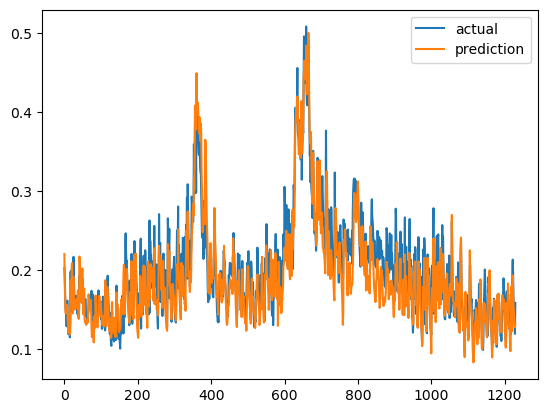

{'mae': 0    0.02151
dtype: float64, 'mape': 0    10.745856
dtype: float64, 'rmse': 0    0.027454
dtype: float64}


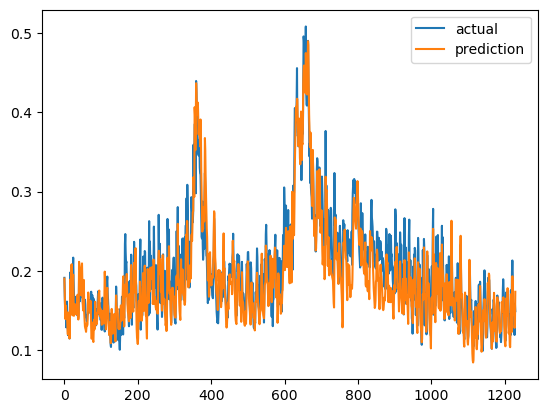

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.0038 - val_loss: 0.0020
Epoch 2/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0020 - val_loss: 0.0019
Epoch 3/1000
158/158 [==============================] - 5s 30ms/step - loss: 0.0019 - val_loss: 0.0016
Epoch 4/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 5/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0013 - val_loss: 0.0011
Epoch 7/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 8/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0011 - val_loss: 9.8888e-04
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0010 - val_loss: 9.7614e-04
Epoch 10/1000
158/158 [==============================] - 5s 32ms/

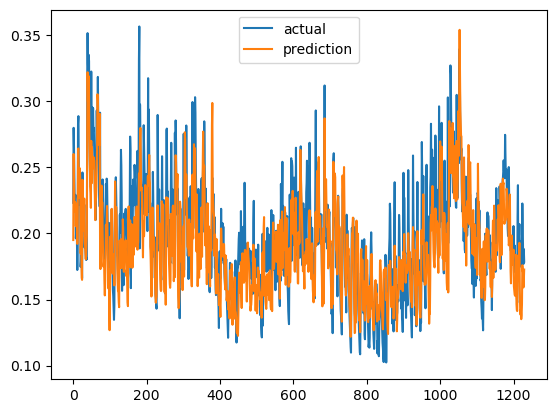

{'mae': 0    0.019982
dtype: float64, 'mape': 0    10.208068
dtype: float64, 'rmse': 0    0.025738
dtype: float64}


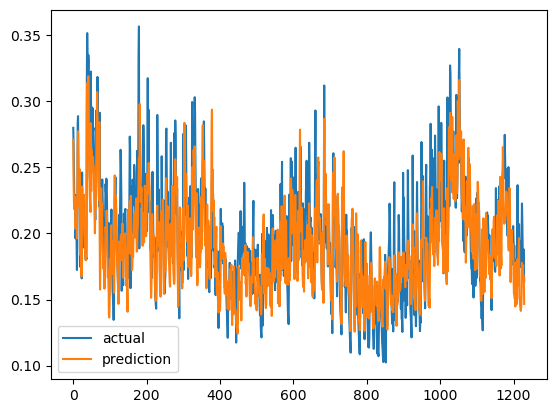

{'mae': 0    0.020008
dtype: float64, 'mape': 0    10.168982
dtype: float64, 'rmse': 0    0.026004
dtype: float64}


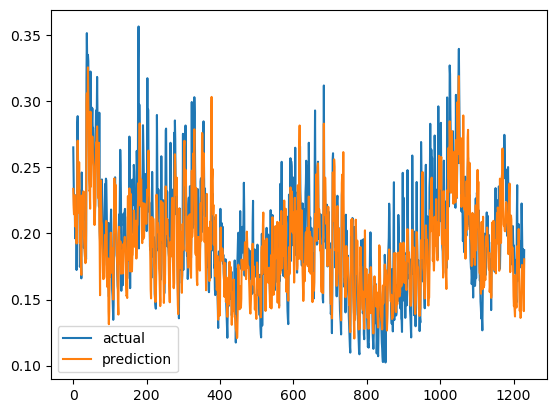

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.0031 - val_loss: 0.0055
Epoch 2/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0017 - val_loss: 0.0053
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0053
Epoch 4/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0015 - val_loss: 0.0047
Epoch 5/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0014 - val_loss: 0.0044
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0013 - val_loss: 0.0038
Epoch 7/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0012 - val_loss: 0.0034
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0011 - val_loss: 0.0035
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0011 - val_loss: 0.0033
Epoch 10/1000
158/158 [==============================] - 5s 31ms/step - l

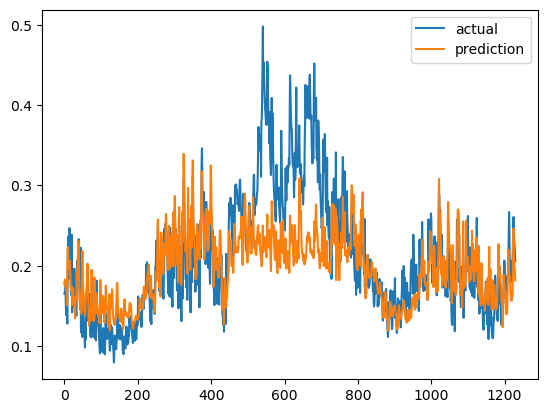

{'mae': 0    0.03696
dtype: float64, 'mape': 0    16.214851
dtype: float64, 'rmse': 0    0.054374
dtype: float64}


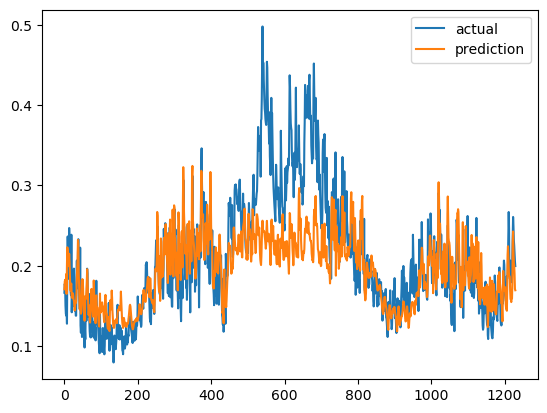

{'mae': 0    0.034491
dtype: float64, 'mape': 0    15.515869
dtype: float64, 'rmse': 0    0.049299
dtype: float64}


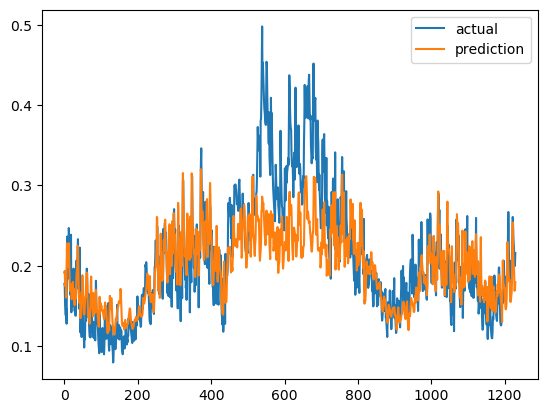

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.0094 - val_loss: 0.0289
Epoch 2/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0053 - val_loss: 0.0119
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0030 - val_loss: 0.0092
Epoch 4/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0024 - val_loss: 0.0077
Epoch 5/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0020 - val_loss: 0.0045
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0043
Epoch 7/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0016 - val_loss: 0.0038
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0027
Epoch 10/1000
158/158 [==============================] - 5s 31ms/step - l

In [ ]:
time_step_list = [40] # 40은 지금 하면 중간에 멈출 듯 ㅇㅅㅇ 나중에 하자
for time_step in time_step_list:
    lstm_model.fit_Bi_Seq2(my_type = "seasonal", time_step = time_step, is_final = 0)

In [ ]:
# 4 block ~ 7 block 해야 됨...

full_data

time_step_list = [40] 

for time_step in time_step_list:
    lstm_model.fit_Bi_Seq2(my_type = "seasonal", time_step = time_step, is_final = 0)

In [16]:
partial_full_data = []
for i in range(3):
    partial_full_data.append(full_data[i][3:6])

2023-10-21 18:14:06.632037: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2023-10-21 18:14:06.652297: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:d8:00.0 name: Tesla V100-PCIE-32GB computeCapability: 7.0
coreClock: 1.38GHz coreCount: 80 deviceMemorySize: 31.72GiB deviceMemoryBandwidth: 836.37GiB/s
2023-10-21 18:14:06.652352: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2023-10-21 18:14:06.654765: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-21 18:14:06.657224: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2023-10-21 18:14:06.657635: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/1000


2023-10-21 18:14:14.713888: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2023-10-21 18:14:15.071468: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7


158/158 [==============================] - 7s 42ms/step - loss: 0.0103 - val_loss: 0.0307
Epoch 2/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0057 - val_loss: 0.0116
Epoch 3/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0031 - val_loss: 0.0143
Epoch 4/1000
158/158 [==============================] - 6s 35ms/step - loss: 0.0024 - val_loss: 0.0074
Epoch 5/1000
158/158 [==============================] - 5s 35ms/step - loss: 0.0019 - val_loss: 0.0043
Epoch 6/1000
158/158 [==============================] - 6s 35ms/step - loss: 0.0016 - val_loss: 0.0049
Epoch 7/1000
158/158 [==============================] - 6s 35ms/step - loss: 0.0017 - val_loss: 0.0046
Epoch 8/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0016 - val_loss: 0.0037
Epoch 9/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 10/1000
158/158 [==============================] - 5s 34ms/step - loss: 0.0015 -

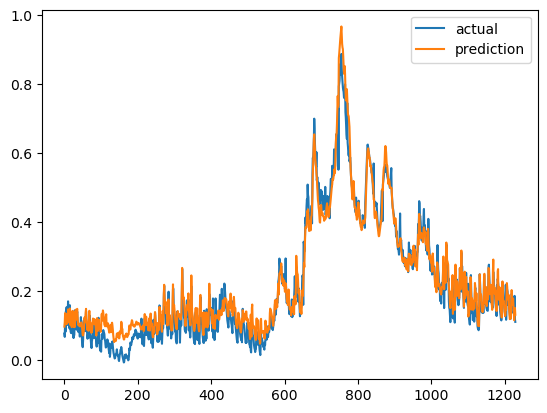

{'mae': 0    0.030546
dtype: float64, 'mape': 0    30.30321
dtype: float64, 'rmse': 0    0.03793
dtype: float64}


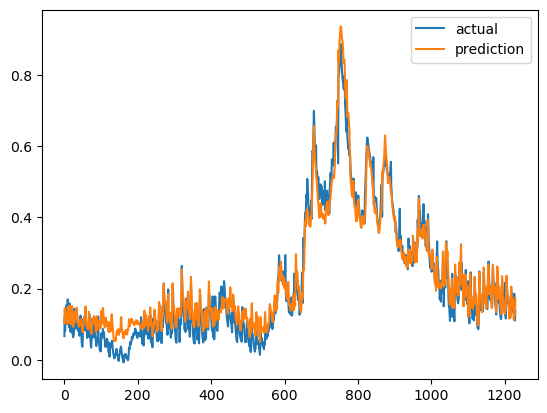

{'mae': 0    0.029358
dtype: float64, 'mape': 0    29.44193
dtype: float64, 'rmse': 0    0.03781
dtype: float64}


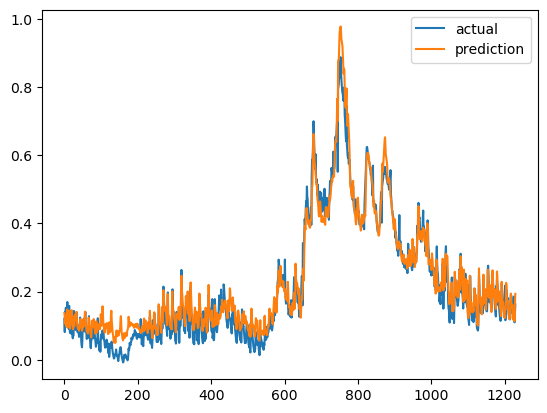

Epoch 1/1000
158/158 [==============================] - 6s 39ms/step - loss: 0.0033 - val_loss: 0.0023
Epoch 2/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0019 - val_loss: 0.0019
Epoch 3/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0019 - val_loss: 0.0018
Epoch 4/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0018 - val_loss: 0.0016
Epoch 5/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 6/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0014 - val_loss: 0.0013
Epoch 7/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0012 - val_loss: 0.0013
Epoch 8/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 10/1000
158/158 [==============================] - 5s 32ms/step - l

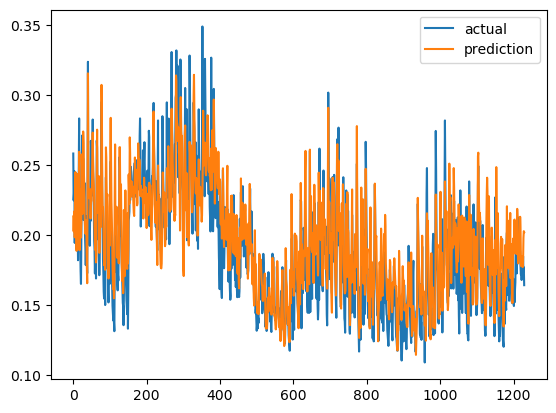

{'mae': 0    0.017618
dtype: float64, 'mape': 0    9.811781
dtype: float64, 'rmse': 0    0.022507
dtype: float64}


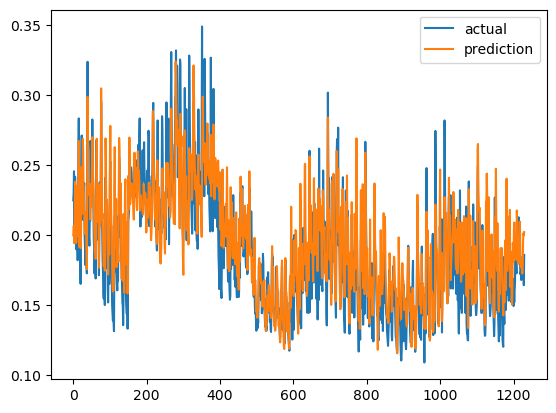

{'mae': 0    0.017602
dtype: float64, 'mape': 0    9.774984
dtype: float64, 'rmse': 0    0.022553
dtype: float64}


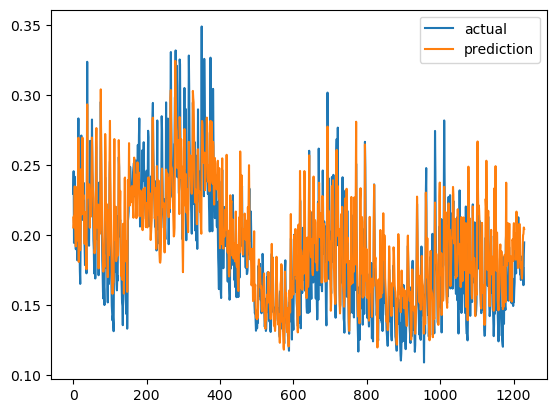

Epoch 1/1000
158/158 [==============================] - 6s 40ms/step - loss: 0.0032 - val_loss: 0.0055
Epoch 2/1000
158/158 [==============================] - 5s 31ms/step - loss: 0.0018 - val_loss: 0.0048
Epoch 3/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0018 - val_loss: 0.0044
Epoch 4/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0016 - val_loss: 0.0040
Epoch 5/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0014 - val_loss: 0.0035
Epoch 6/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 7/1000
158/158 [==============================] - 5s 32ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 8/1000
158/158 [==============================] - 5s 33ms/step - loss: 0.0010 - val_loss: 0.0025
Epoch 9/1000
158/158 [==============================] - 5s 32ms/step - loss: 9.5776e-04 - val_loss: 0.0020
Epoch 10/1000
158/158 [==============================] - 5s 32ms/step

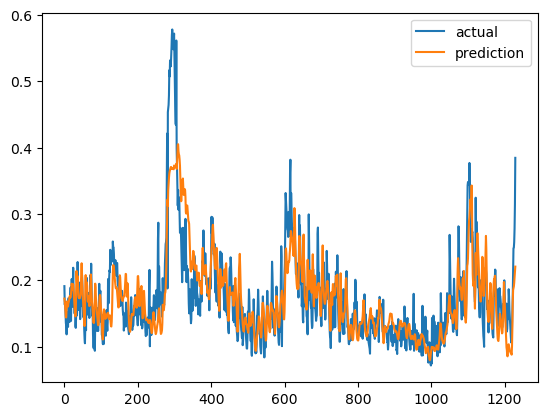

{'mae': 0    0.029224
dtype: float64, 'mape': 0    16.628633
dtype: float64, 'rmse': 0    0.041236
dtype: float64}


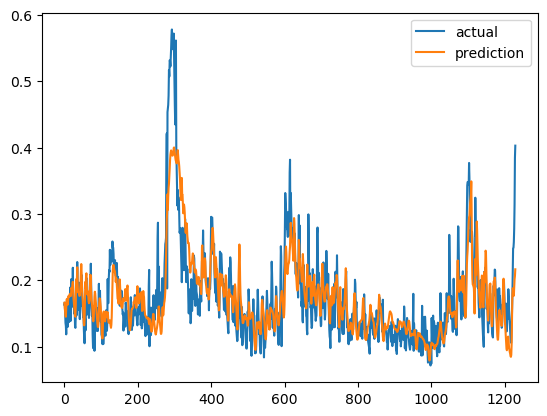

{'mae': 0    0.028288
dtype: float64, 'mape': 0    15.940977
dtype: float64, 'rmse': 0    0.041005
dtype: float64}


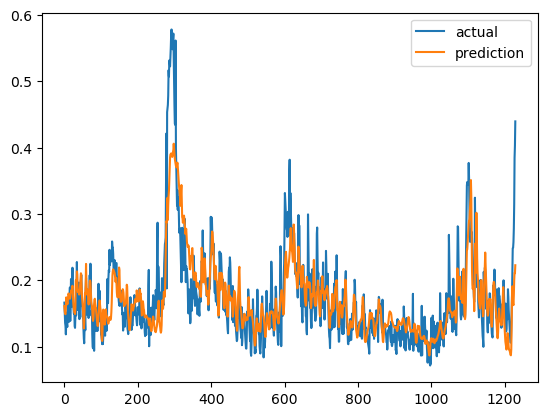

In [19]:
new_model = lstm_model(partial_full_data)
new_model.fit_Bi_Seq2(my_type = "seasonal", time_step = 40, is_final = 0)